# Datojen haku ja esikäsittely

In [1]:
from sklearn.feature_selection import mutual_info_regression
import pandas as pd
from sklearn.model_selection import train_test_split
import shap
import xgboost as xgb
from create_shap_values_via_xgboost import create_shap_values_via_xgboost
from create_target_columns import create_target_columns
from print_examples import show_all_results, create_party_results, show_one_results
from show_election_result import show_election_result
from set_path import set_path
from read_and_prepare_data import read_and_prepare_data
from selected_cols import selected_cols
from create_prediction import optimize_one_par

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
pd.options.display.max_colwidth = 100

In [2]:
mainpath, path = set_path('areadata')
stat, post, kunta_stat, vaalidata = read_and_prepare_data(path)
numeric_features, categorical_features = selected_cols(largeset=False, parties=False)

read_and_prepare_data  read from file


In [3]:
#set values to feature engineering attributes

test_size = 0.3
metric = 'rmse'
Skfold=False
Verbose = False
testing=True
scaled = False

initial_params = {
        #Initial xgboost parameters to be automatically tuned
        'objective':'reg:squarederror',
        'booster' : 'gbtree',
        'eval_metric' : metric,
        'seed' : 42,
        }

filename = 'party_xgboost_vote_share_'

list_of_parties = ['VIHR', 'KOK', 'SDP', 'KD', 'KESK', 'RKP', 'PS', 'VAS']
selected_parties = list_of_parties
included_col_start = 'Ääniosuus '
all_included_columns = create_target_columns(list_of_parties, included_col_start)

target_col_start = 'Ääniosuus '
target = create_target_columns(selected_parties, target_col_start)


In [4]:
data, X, y, test, X_test, y_test_pred, model_list, model_params, explainer_list, shap_values, features_dict = create_shap_values_via_xgboost(path,
                               filename,
                               stat,
                               stat,
                               target,
                               initial_params,
                               numeric_features=numeric_features,
                               categorical_features=categorical_features,
                               scaled=scaled,
                               test_size=test_size,
                               Skfold=Skfold,
                               Verbose=Verbose,
                               testing=testing)

Ääniosuus VIHR
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data\party_xgboost_vote_share_Ääniosuus VIHR_model.pkl
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data\party_xgboost_vote_share_Ääniosuus VIHR_shap.pkl
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data\party_xgboost_vote_share_Ääniosuus VIHR_features.pkl
--- 0.9545056819915771 seconds ---

Ääniosuus KOK
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data\party_xgboost_vote_share_Ääniosuus KOK_model.pkl
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data\party_xgboost_vote_share_Ääniosuus KOK_shap.pkl
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data\party_xgboost_vote_share_Ääniosuus KOK_features.pkl
--- 0.8117215633392334 seconds ---

Ääniosuus SDP
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data\party_xgboost_vote_share_Ääniosuus SDP_model.pkl
Load model filename  C:\Users\risto\Documents\GitHub\areadata\data

In [5]:
for t in target:
    data.loc[:,"Ennustettu "+ t] = y_test_pred[t]

included_col_start = 'Ennustettu Ääniosuus '
ennustettu = create_target_columns(list_of_parties, included_col_start)
data.loc[:,'Ennustettu Suurin_puolue'] = data[ennustettu].idxmax(axis=1).str.split(' ', 3, expand=True)[2]
data.loc[:,'Ennustettu Suurin_puolue numero'] = data['Ennustettu Suurin_puolue'].astype('category').cat.codes

show_election_result(data, vaalidata, target_col_start, selected_parties)

VIHR  lasketut äänet: Aitotulos  354152 Laskennallinen  344923 Ennuste  347860
Laskennallisen virhe aitoon tulokseen 2.606 %
Ennusteen virhe aitoon tulokseen 1.777 %
Ennusteen virhe laskennalliseen tulokseen -0.852 %
Laskennallinen ääniosuus 11.405 %
Aito ääniosuus 11.429 %

KOK  lasketut äänet: Aitotulos  523924 Laskennallinen  514711 Ennuste  513834
Laskennallisen virhe aitoon tulokseen 1.758 %
Ennusteen virhe aitoon tulokseen 1.926 %
Ennusteen virhe laskennalliseen tulokseen 0.17 %
Laskennallinen ääniosuus 16.847 %
Aito ääniosuus 16.908 %

SDP  lasketut äänet: Aitotulos  546263 Laskennallinen  538953 Ennuste  536214
Laskennallisen virhe aitoon tulokseen 1.338 %
Ennusteen virhe aitoon tulokseen 1.84 %
Ennusteen virhe laskennalliseen tulokseen 0.508 %
Laskennallinen ääniosuus 17.58 %
Aito ääniosuus 17.629 %

KD  lasketut äänet: Aitotulos  120019 Laskennallinen  117310 Ennuste  118664
Laskennallisen virhe aitoon tulokseen 2.257 %
Ennusteen virhe aitoon tulokseen 1.129 %
Ennusteen virhe

In [6]:
compare_value = 1.5
columns = 12
scaled = True
included_columns = ['Miehet, 2018 (HE) osuudesta asukkaat']
samples = 5
show_cols = ['Postinumero','nimi', 'muncipality_name','Asukkaat yhteensä, 2018 (HE)', 'Suurin_puolue', 'Ennustettu Suurin_puolue']

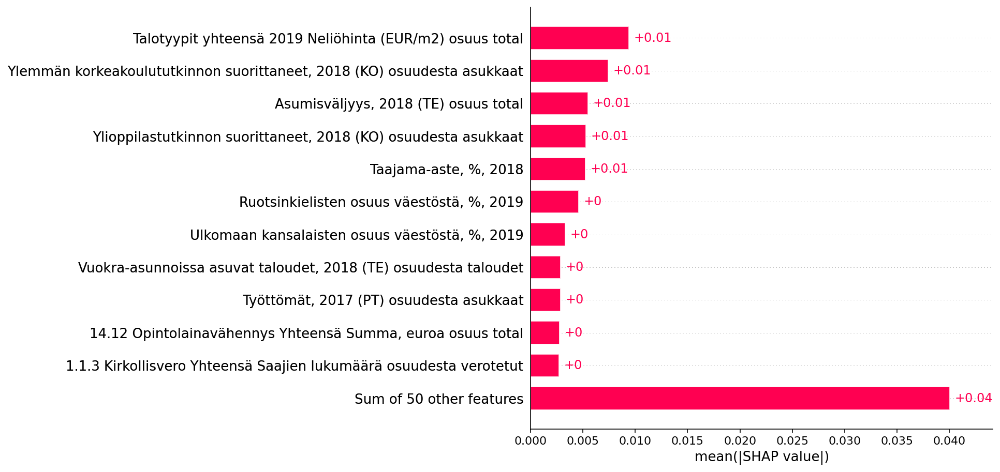

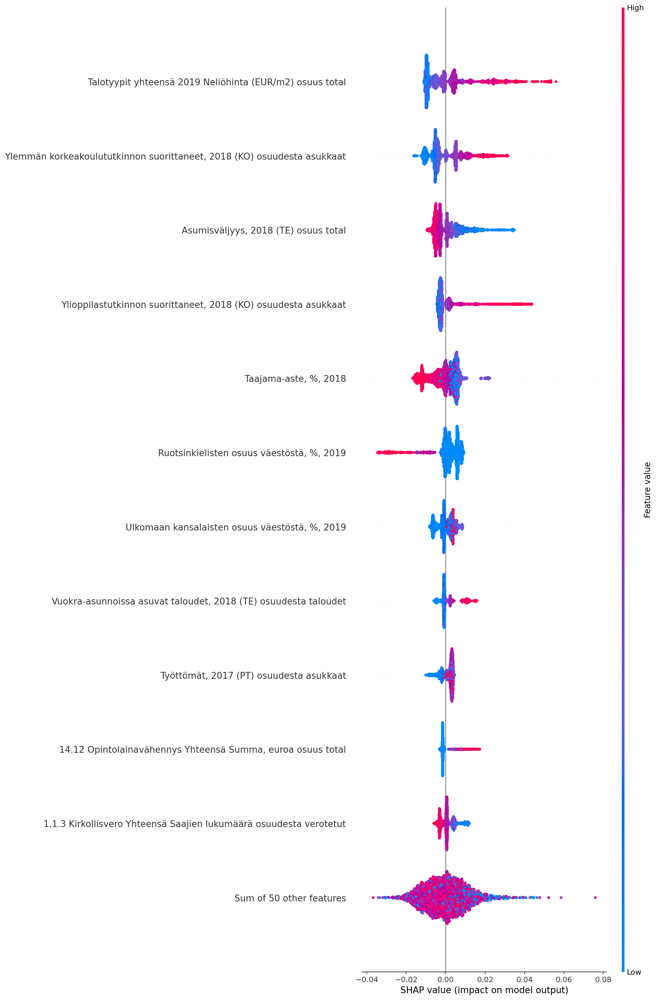

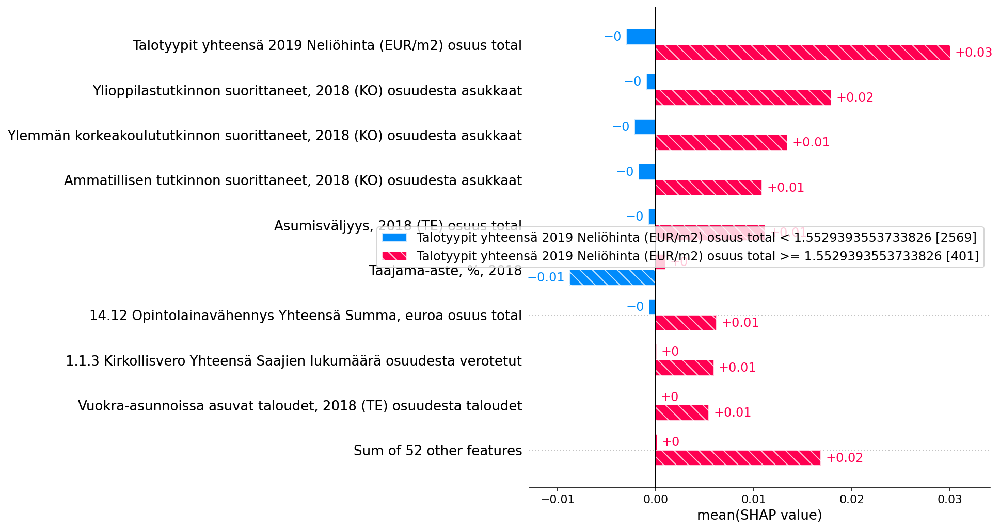

 52%|██████████████████████                    | 32/61 [02:19<02:15,  4.68s/it]No/low signal found from feature 31 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 32 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
100%|██████████████████████████████████████████| 61/61 [04:29<00:00,  5.46s/it]No/low signal found from feature 60 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
62it [04:29,  4.34s/it]                                                        


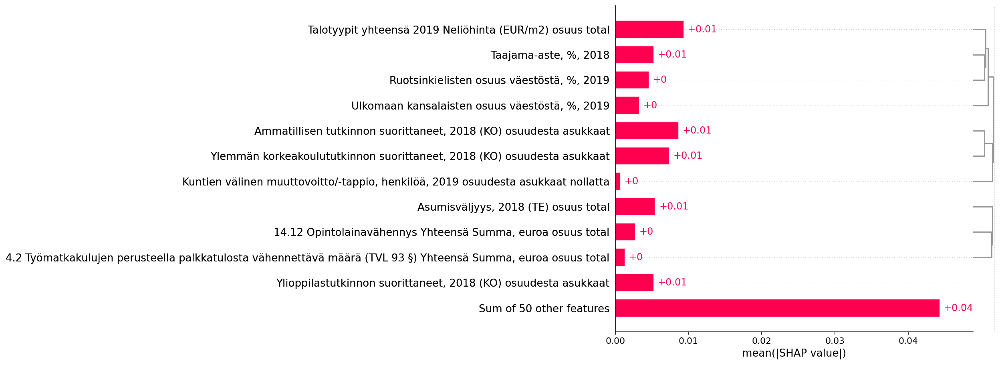

FixedFormatter should only be used together with FixedLocator


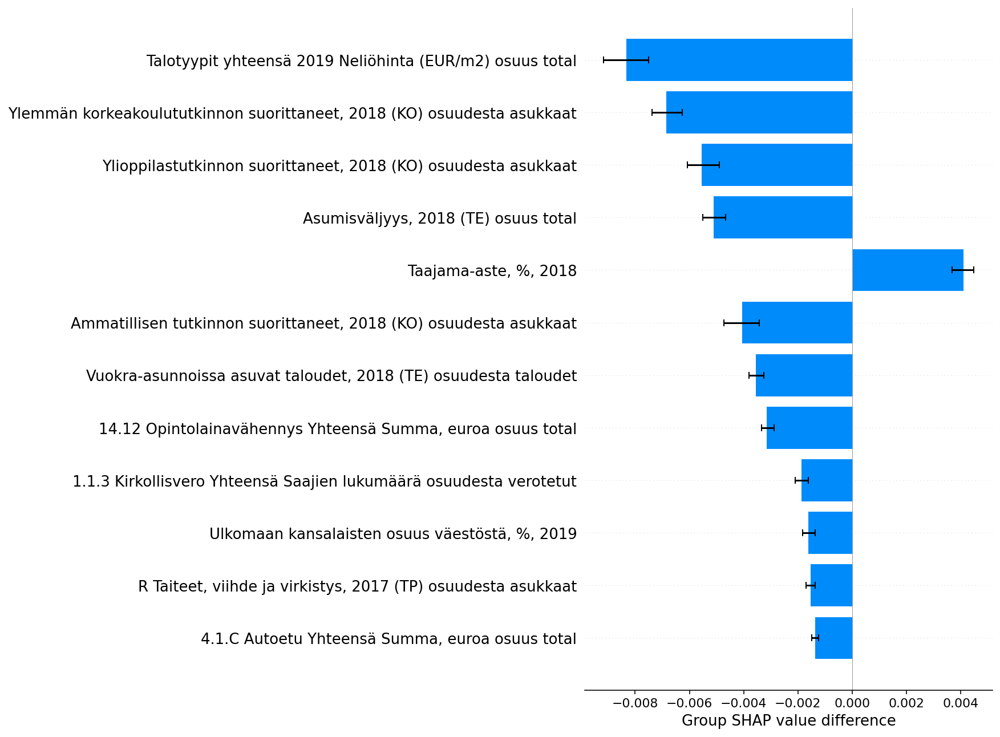

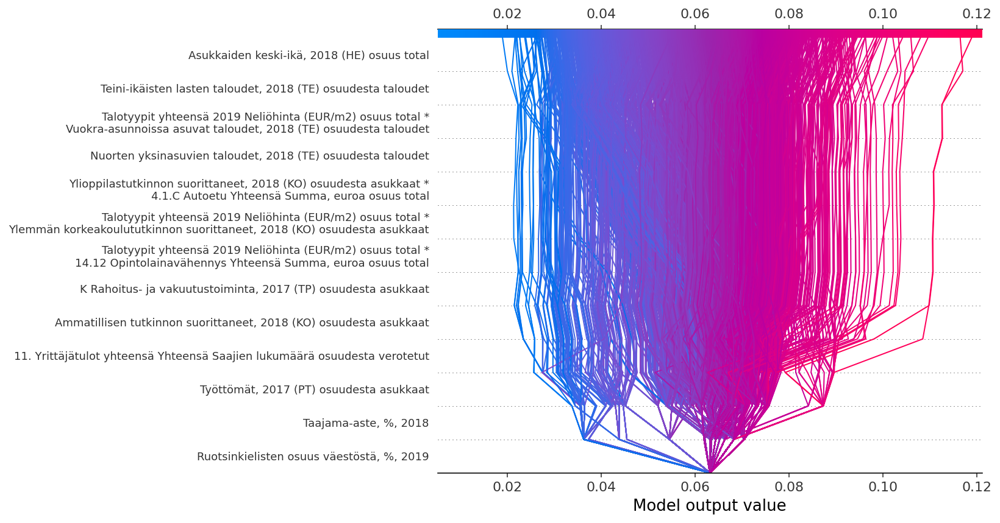

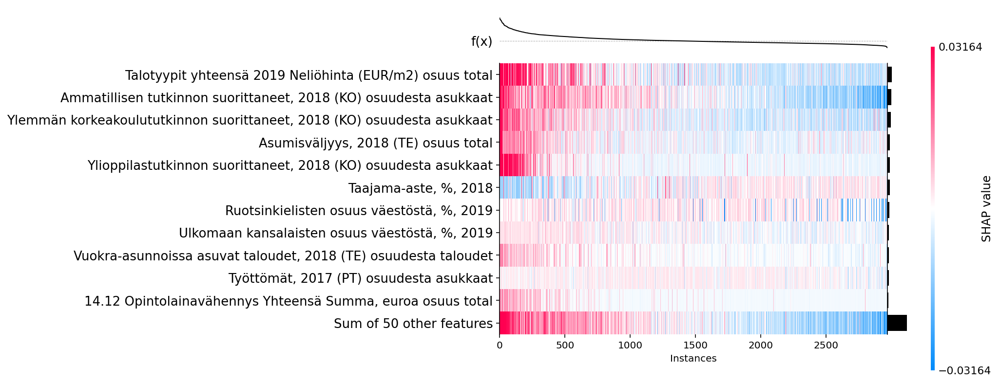

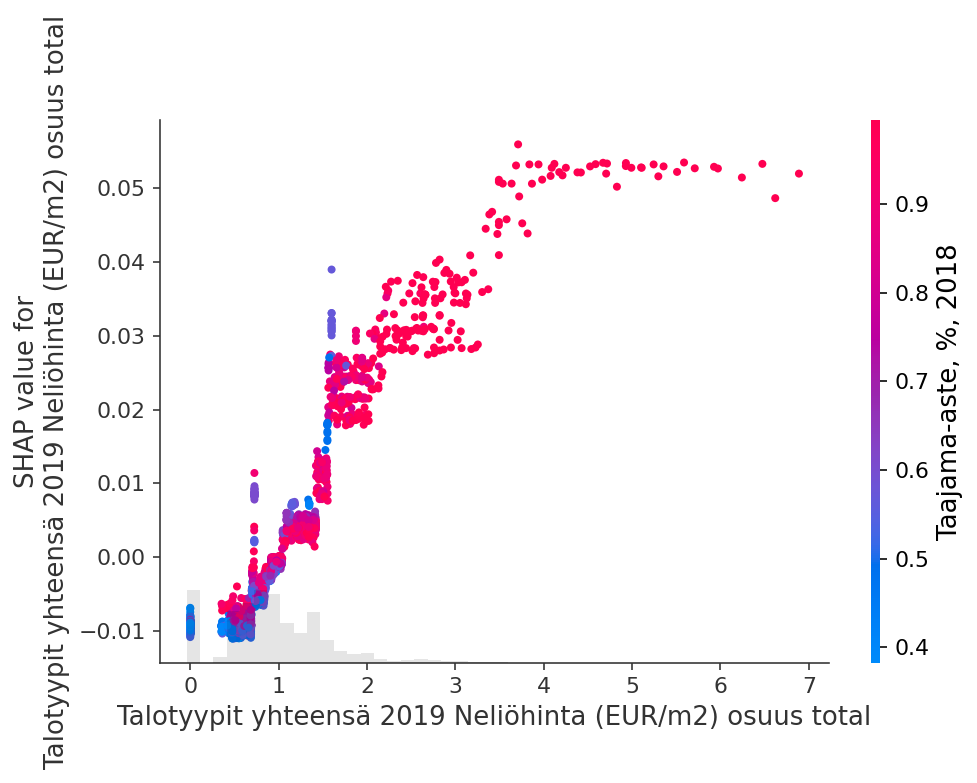

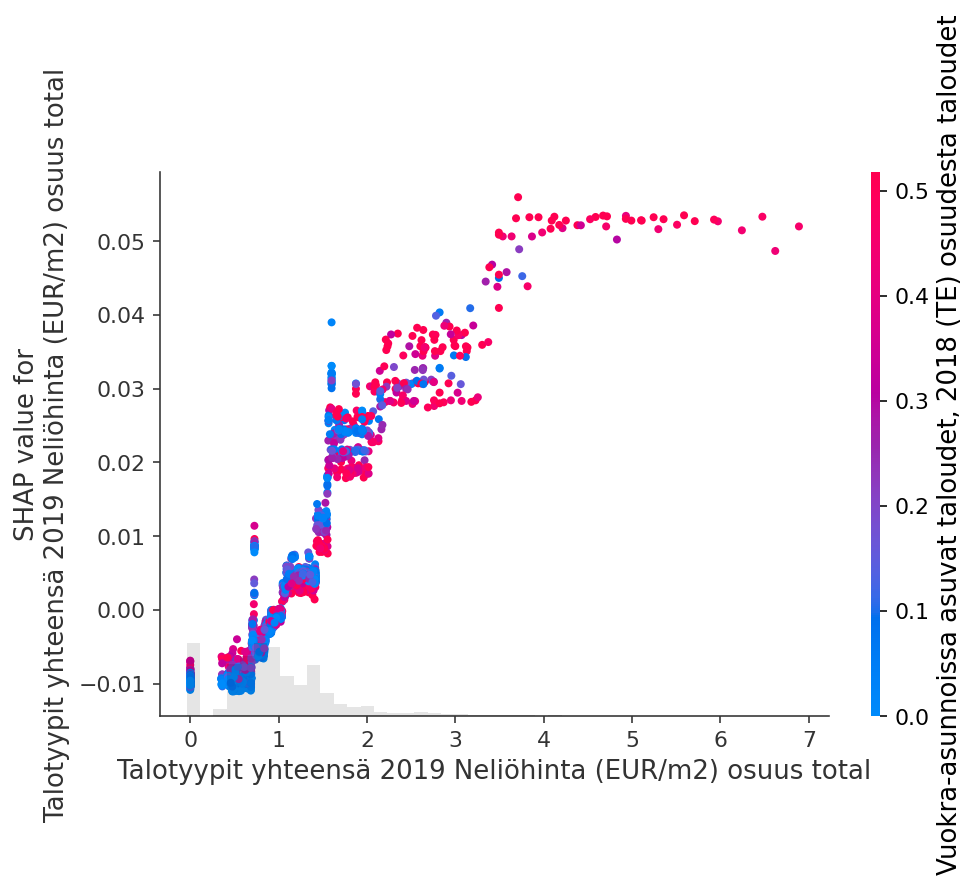

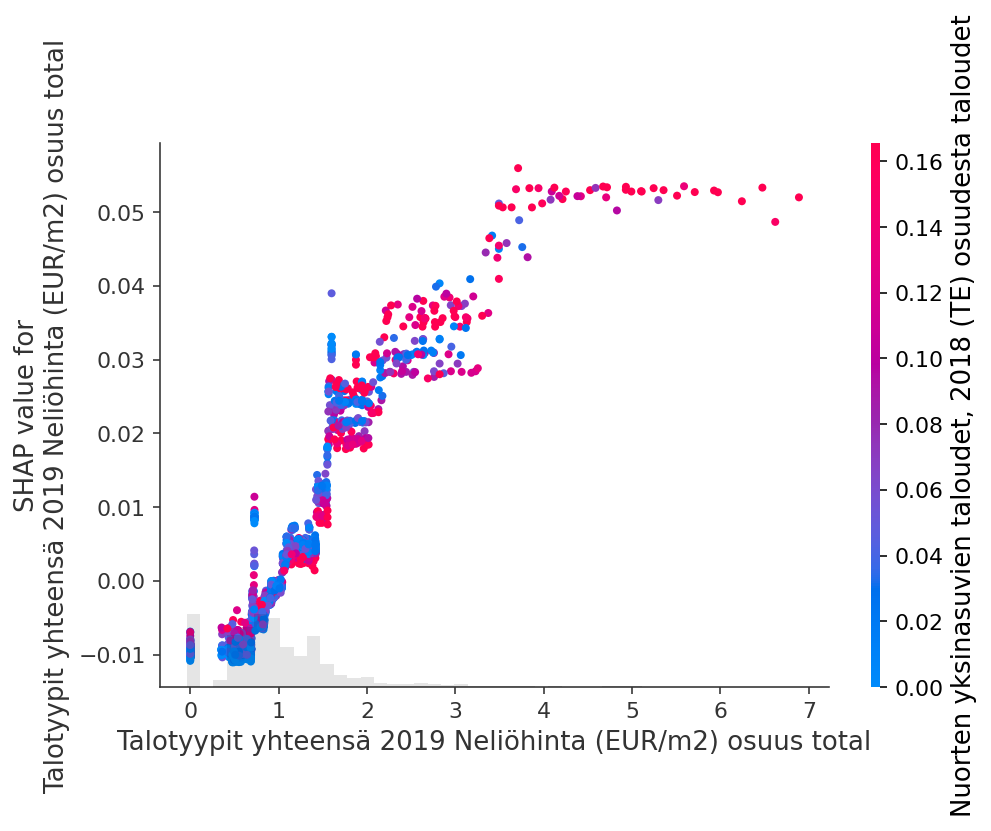

,Postinumero,nimi,muncipality_name,"Asukkaat yhteensä, 2018 (HE)",Suurin_puolue,Ennustettu Suurin_puolue,Ääniosuus VIHR,Talotyypit yhteensä 2019 Neliöhinta (EUR/m2) osuus total,"Asumisväljyys, 2018 (TE) osuus total","Ammatillisen tutkinnon suorittaneet, 2018 (KO) osuudesta asukkaat","Ylioppilastutkinnon suorittaneet, 2018 (KO) osuudesta asukkaat","Ylemmän korkeakoulututkinnon suorittaneet, 2018 (KO) osuudesta asukkaat","Työttömät, 2017 (PT) osuudesta asukkaat","Vuokra-asunnoissa asuvat taloudet, 2018 (TE) osuudesta taloudet",1.1.3 Kirkollisvero Yhteensä Saajien lukumäärä osuudesta verotetut,"14.12 Opintolainavähennys Yhteensä Summa, euroa osuus total","Ruotsinkielisten osuus väestöstä, %, 2019","Taajama-aste, %, 2018","Ulkomaan kansalaisten osuus väestöstä, %, 2019"
1016,33900,Härmälä-Rantaperkiö,Tampere,12077.0,SDP,SDP,0.183512,2.078935,0.756836,0.358119,0.092738,0.112528,0.079407,0.653561,0.490393,2.672402,0.005,0.986,0.049
135,02110,Otsolahti,Espoo,2779.0,KOK,KOK,0.292962,4.212813,0.778710,0.156531,0.107593,0.341490,0.032386,0.391188,0.488076,3.683360,0.069,0.995,0.116
44,00620,Metsälä-Etelä-Oulunkylä,Helsinki,3285.0,VIHR,KOK,0.245126,3.202836,0.874955,0.229528,0.091629,0.221309,0.032268,0.335496,0.431489,2.290262,0.056,1.000,0.097
2963,99885,Lemmenjoki,Inari,51.0,VIHR,KESK,0.269231,1.090774,0.901203,0.450980,0.058824,0.078431,0.078431,0.000000,0.531915,0.000000,0.003,0.659,0.026
595,20100,Turku Keskus,Turku,27104.0,KOK,KOK,0.171633,2.831165,0.842144,0.307150,0.160714,0.160272,0.059475,0.577051,0.528231,3.092187,0.055,0.991,0.067


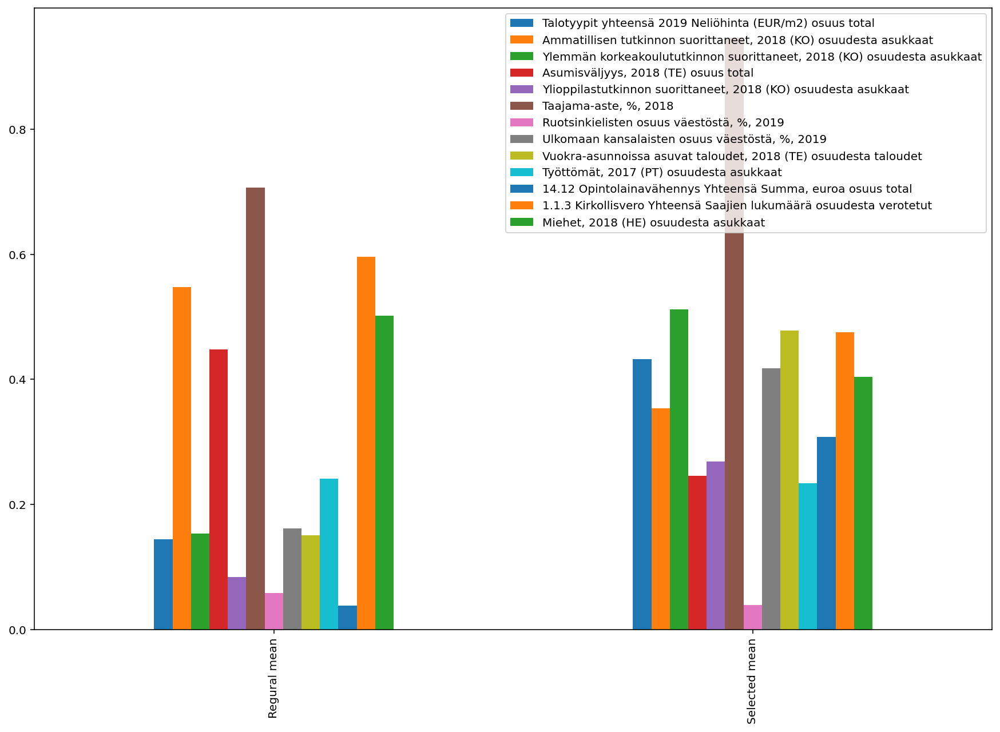

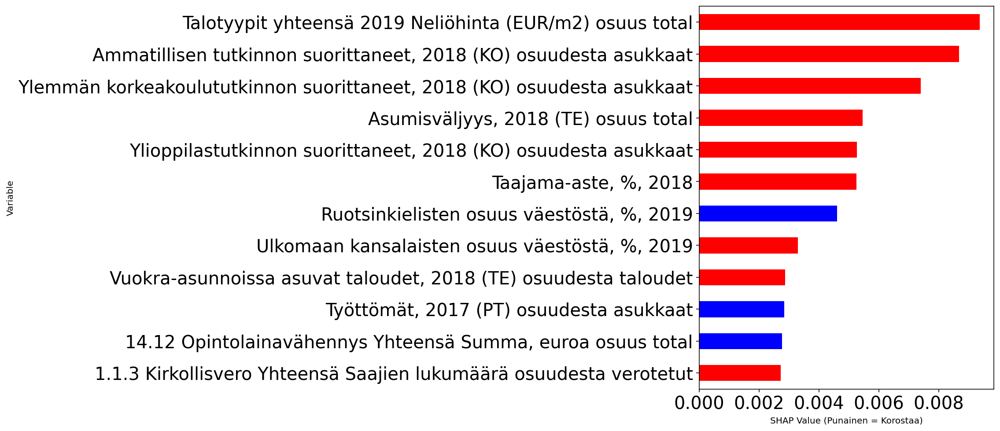

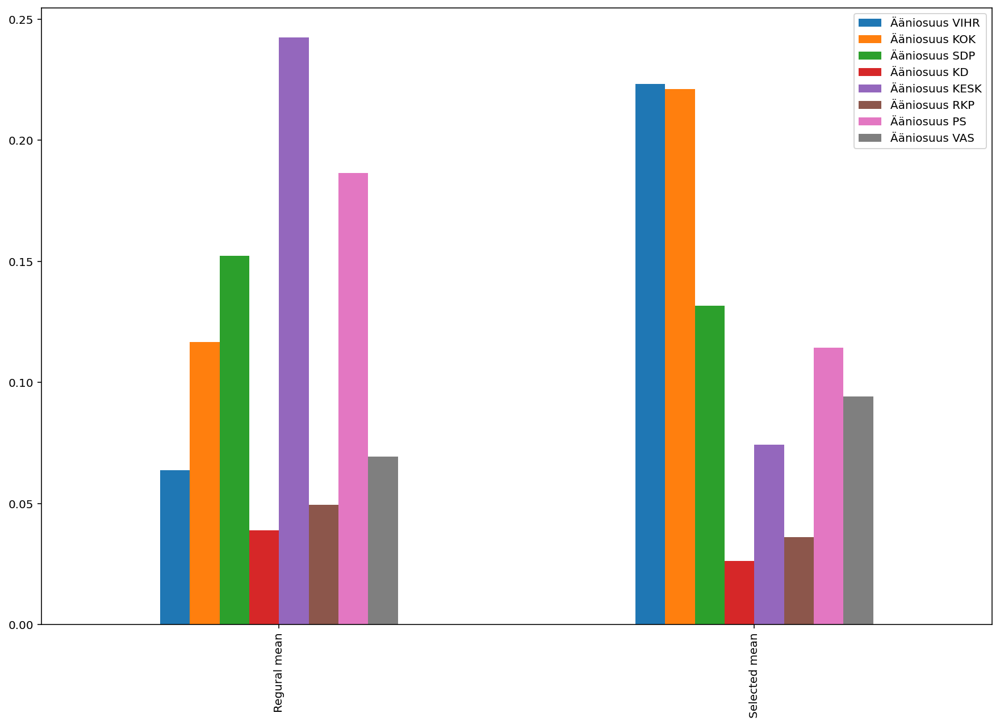

In [7]:
party = 'VIHR'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

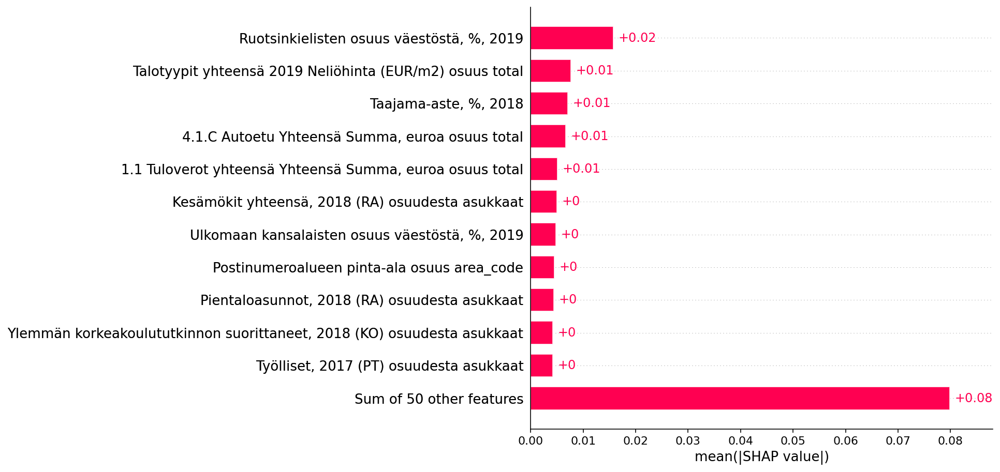

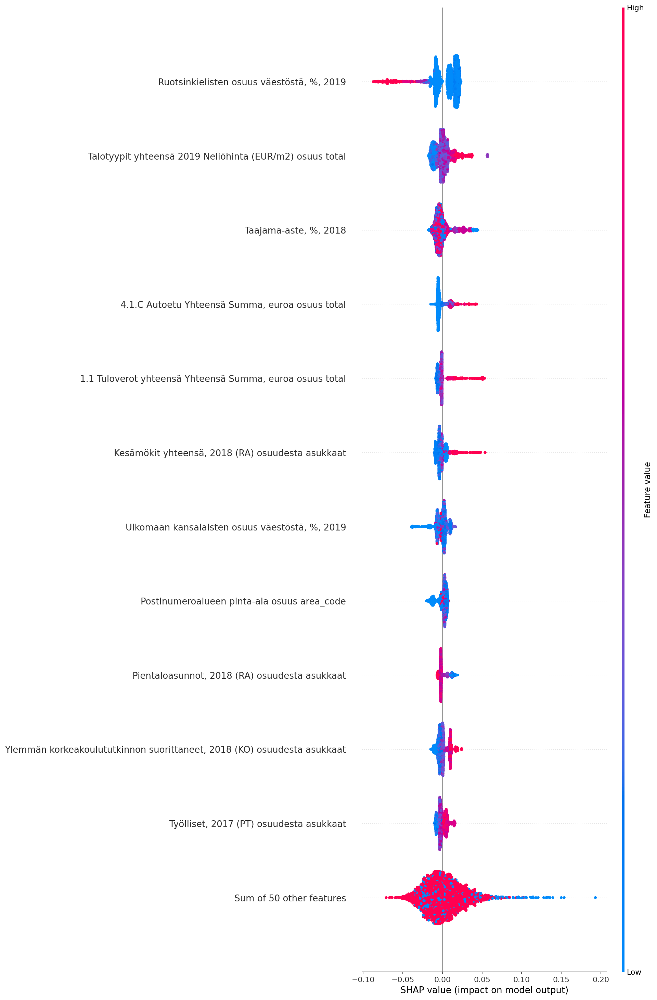

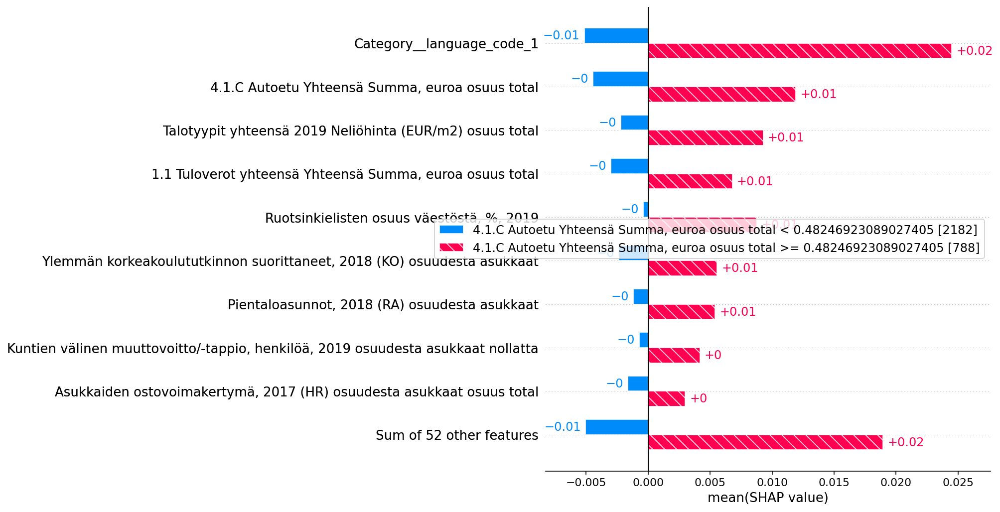

 97%|████████████████████████████████████████▌ | 59/61 [04:28<00:09,  4.83s/it]No/low signal found from feature 58 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
62it [04:37,  4.48s/it]                                                        


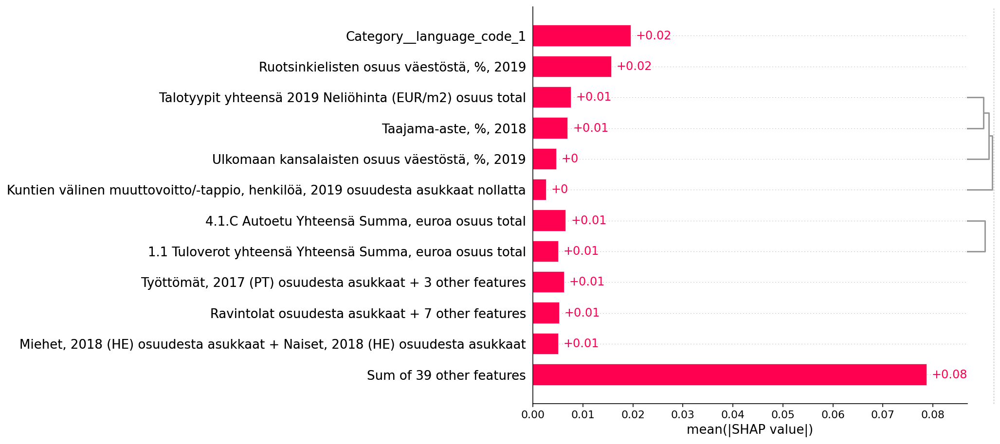

FixedFormatter should only be used together with FixedLocator


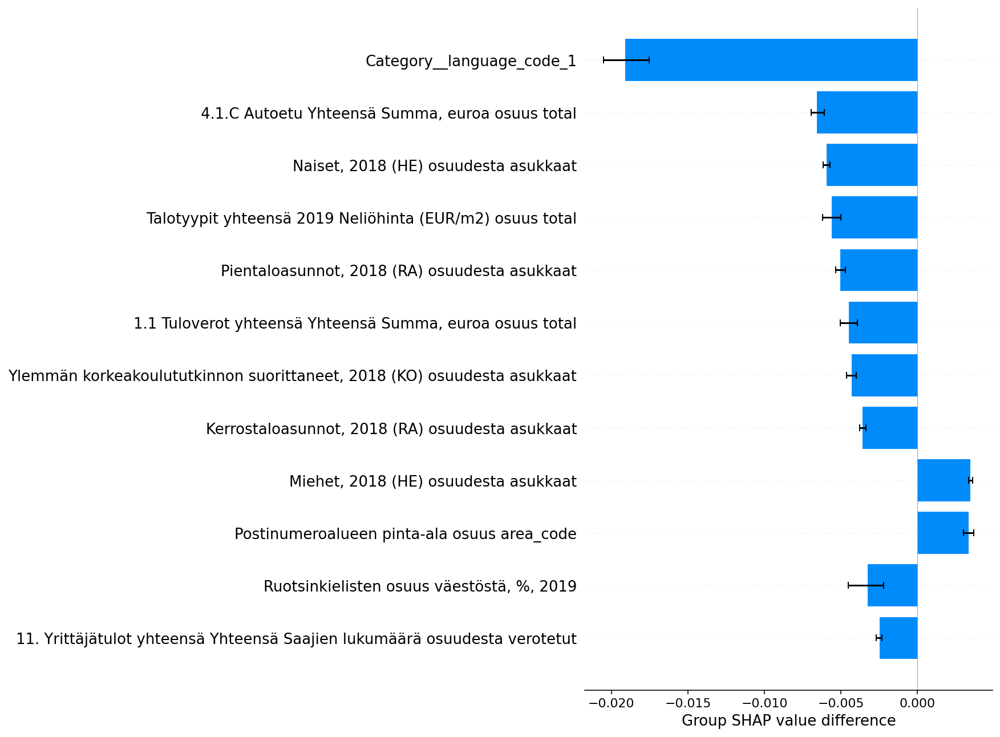

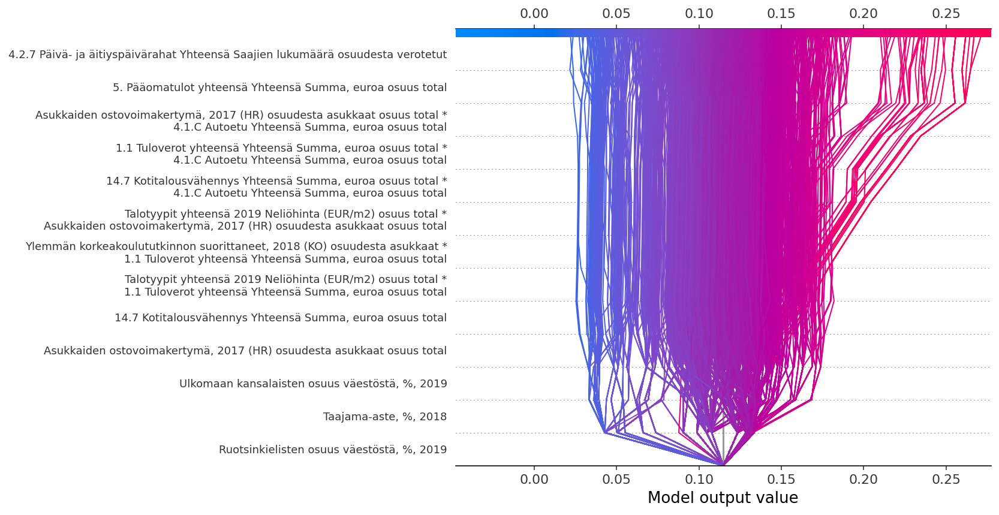

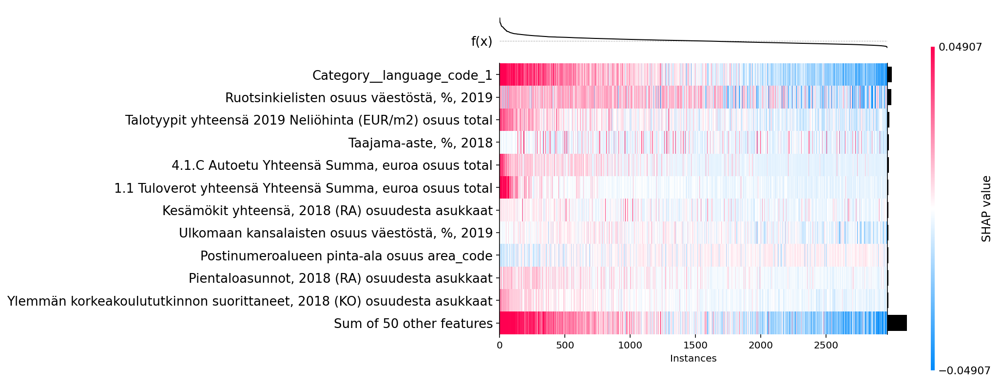

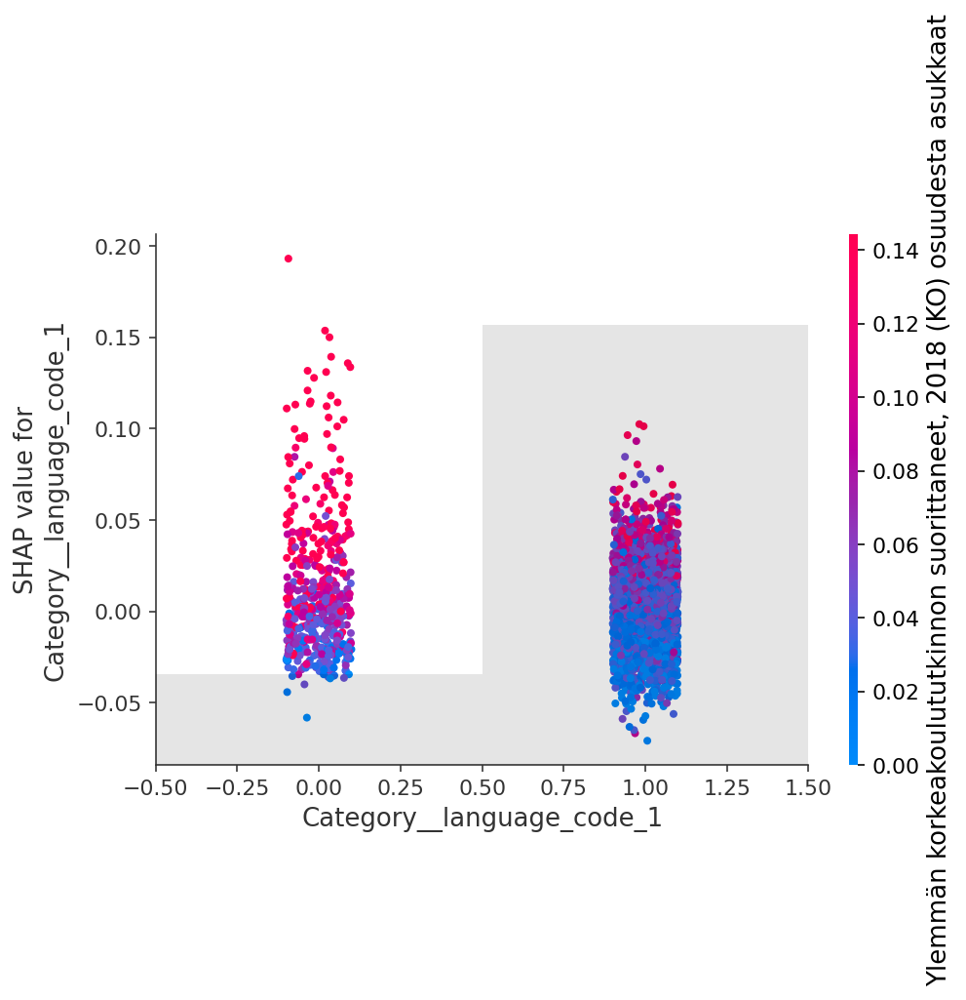

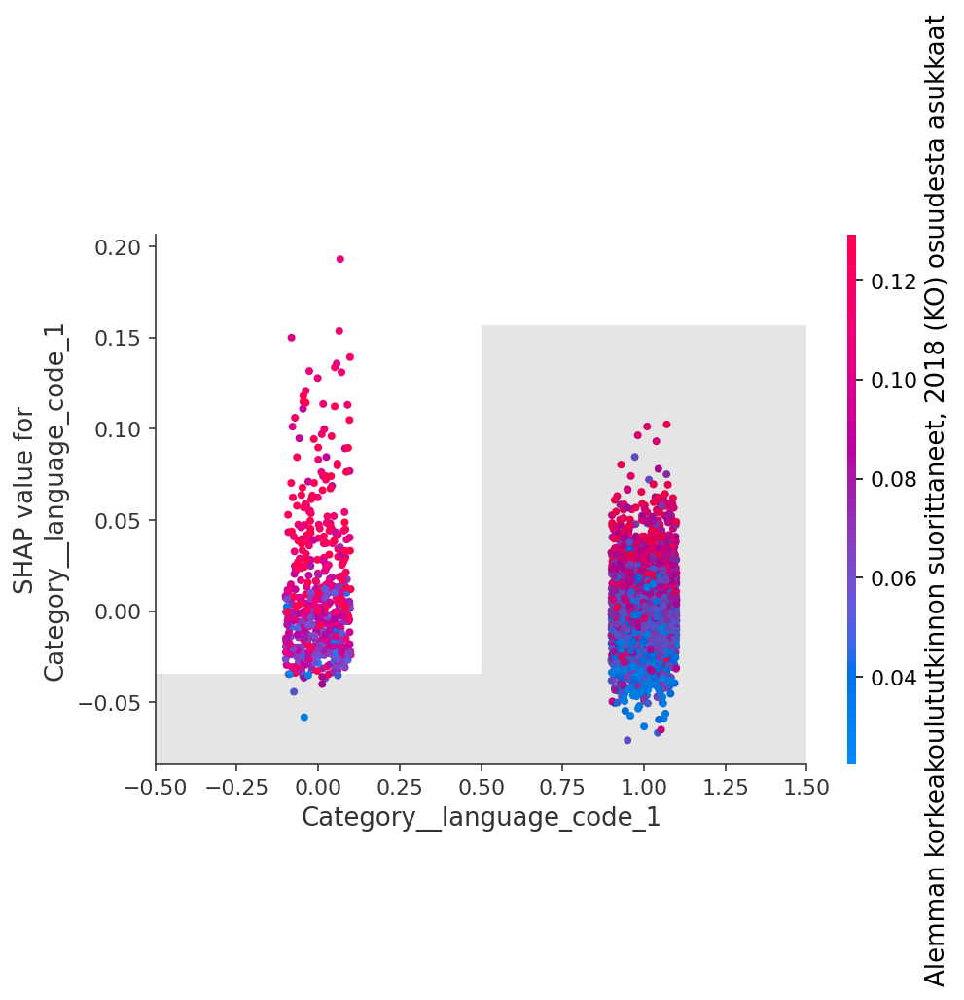

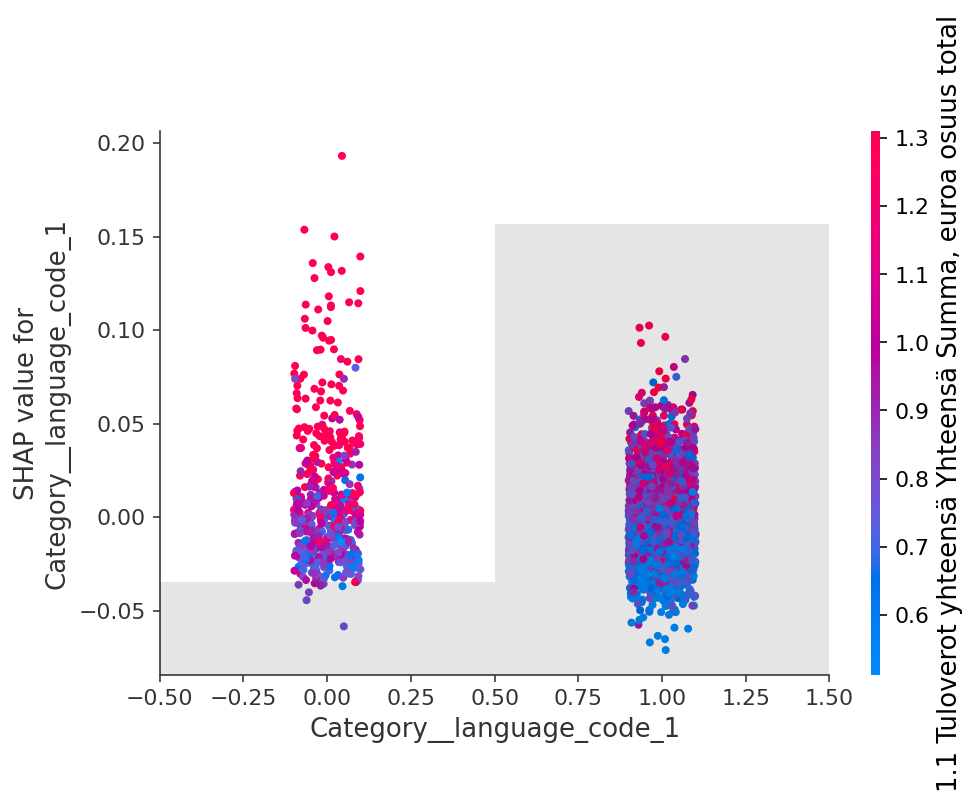

,Postinumero,nimi,muncipality_name,"Asukkaat yhteensä, 2018 (HE)",Suurin_puolue,Ennustettu Suurin_puolue,Ääniosuus KOK,Talotyypit yhteensä 2019 Neliöhinta (EUR/m2) osuus total,Postinumeroalueen pinta-ala osuus area_code,"Ylemmän korkeakoulututkinnon suorittaneet, 2018 (KO) osuudesta asukkaat","Kesämökit yhteensä, 2018 (RA) osuudesta asukkaat","Pientaloasunnot, 2018 (RA) osuudesta asukkaat","Työlliset, 2017 (PT) osuudesta asukkaat","1.1 Tuloverot yhteensä Yhteensä Summa, euroa osuus total","4.1.C Autoetu Yhteensä Summa, euroa osuus total","Ruotsinkielisten osuus väestöstä, %, 2019","Taajama-aste, %, 2018","Ulkomaan kansalaisten osuus väestöstä, %, 2019",Category__language_code_1
986,33200,Tampere Keskus Läntinen,Tampere,6479.0,KOK,KOK,0.270563,2.981450,0.000064,0.177960,0.000000,0.002624,0.477852,1.185605,1.130493,0.005,0.986,0.049,1
1056,33950,Killo,Pirkkala,5833.0,KOK,KOK,0.269530,1.897947,0.000553,0.136122,0.002743,0.212412,0.460826,1.331308,2.159872,0.004,0.977,0.021,1
86,04150,Martinkylä,Sipoo,633.0,KOK,KOK,0.301299,1.788870,0.001330,0.107425,0.044234,0.426540,0.499210,1.290792,2.991312,0.307,0.843,0.036,0
1448,49720,Hurttala,Miehikkälä,56.0,KESK,KESK,0.272727,0.000000,0.006400,0.000000,0.767857,0.571429,0.482143,0.561525,0.000000,0.003,0.307,0.032,1
66,00840,Laajasalo,Helsinki,8233.0,KOK,KOK,0.257114,2.898228,0.000319,0.192639,0.000364,0.174784,0.428398,1.420994,2.387335,0.056,1.000,0.097,0


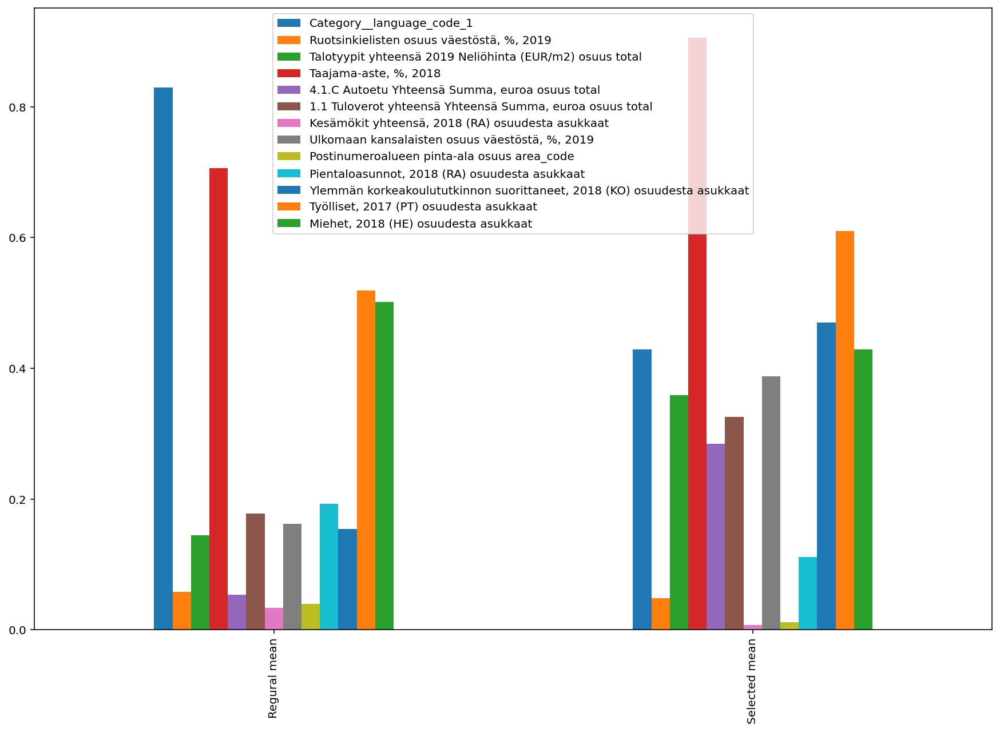

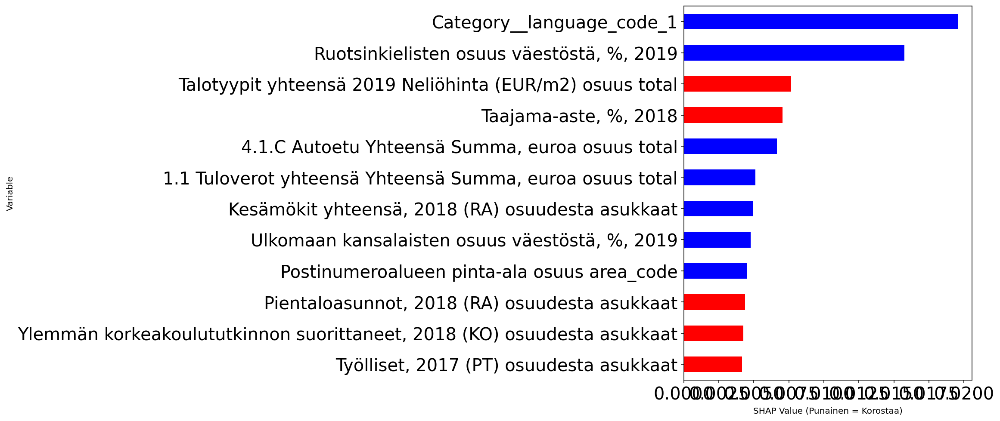

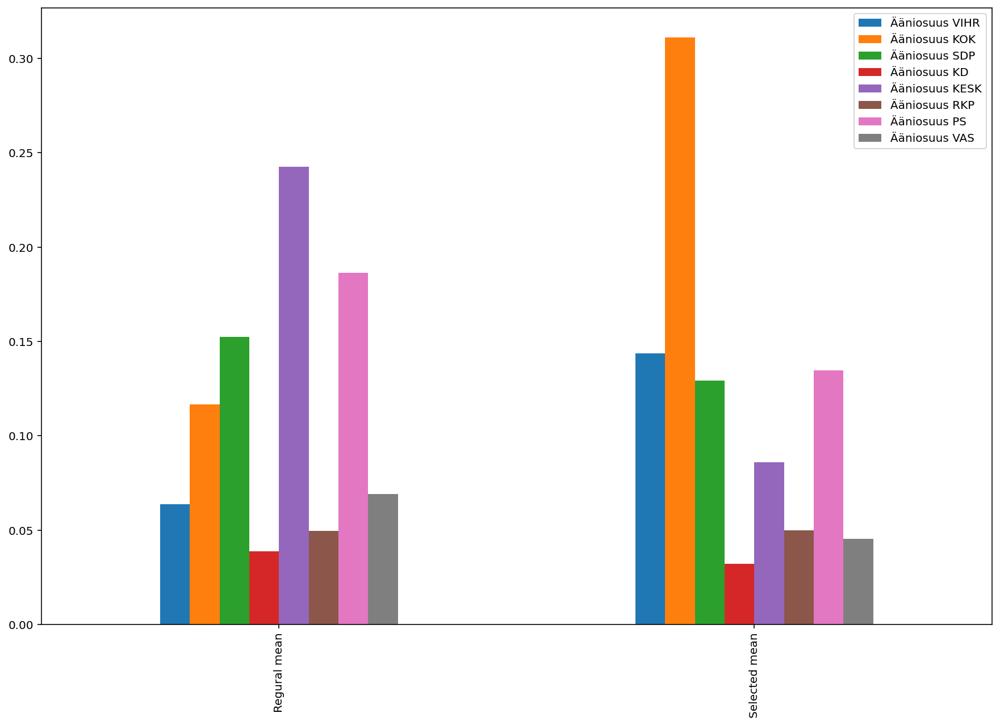

In [8]:
party = 'KOK'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

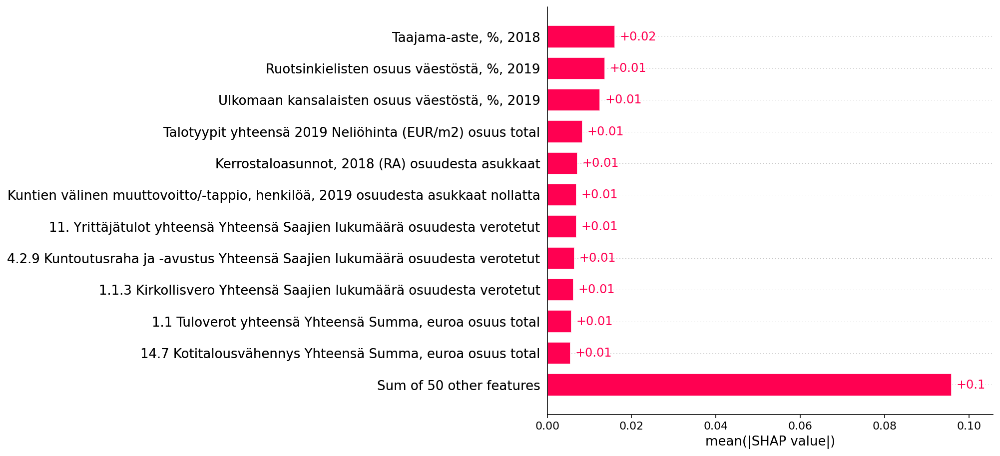

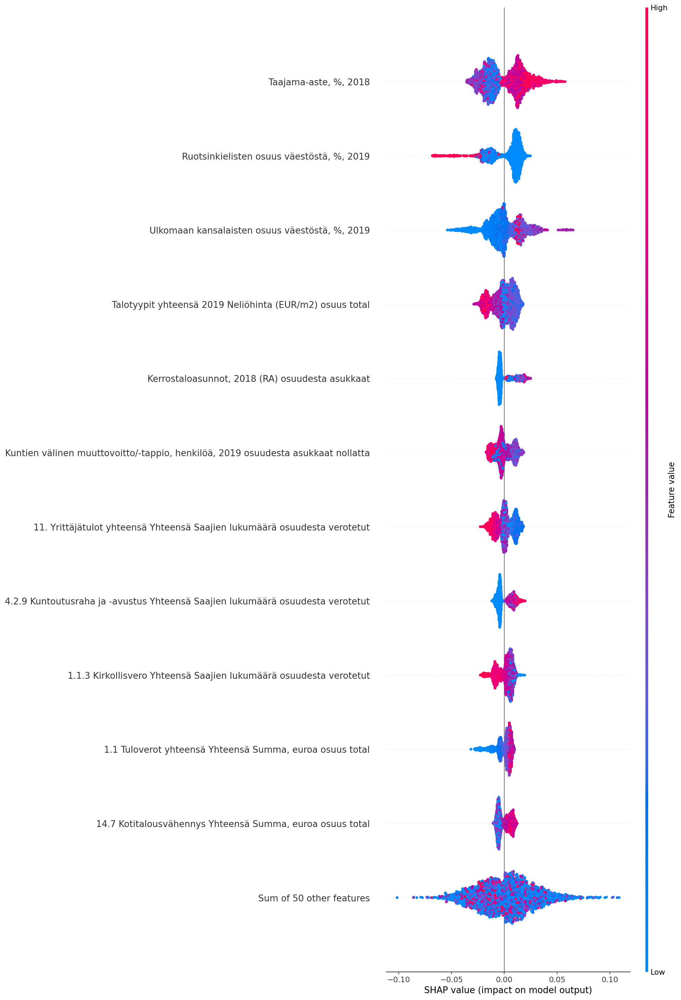

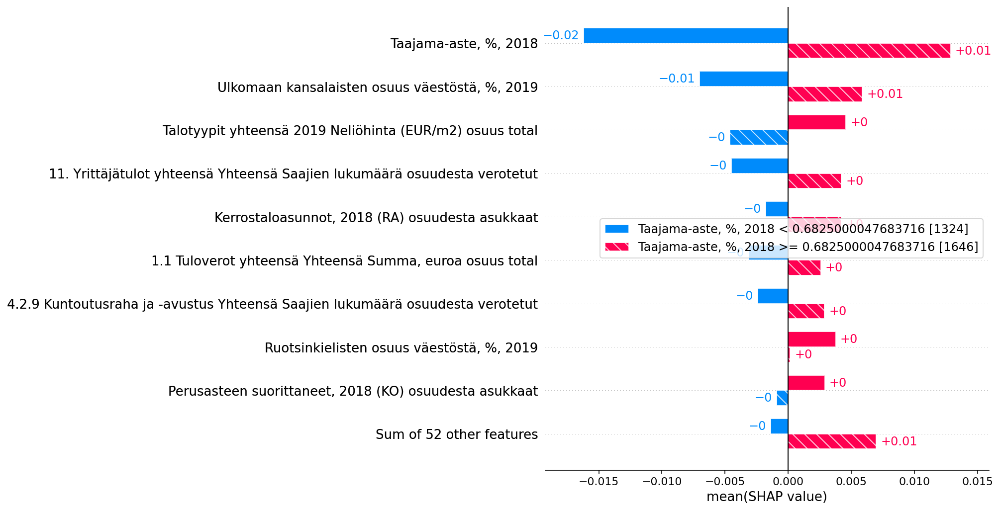

 97%|████████████████████████████████████████▌ | 59/61 [03:52<00:08,  4.40s/it]No/low signal found from feature 58 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 59 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
62it [03:56,  3.82s/it]                                                        


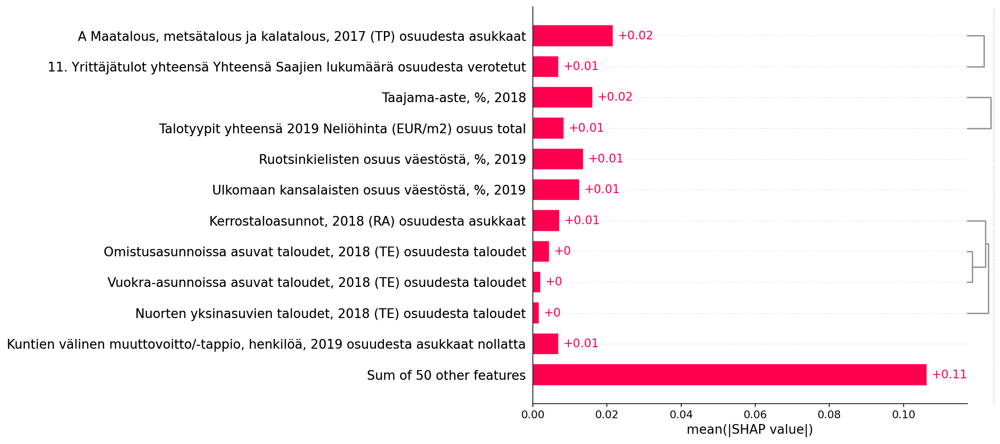

FixedFormatter should only be used together with FixedLocator


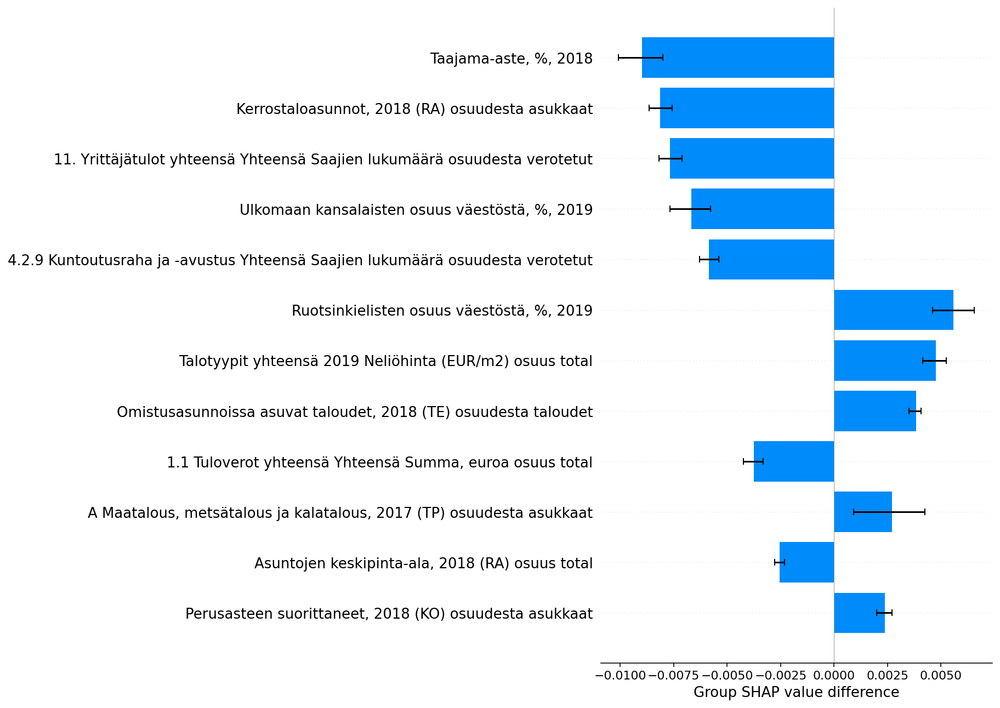

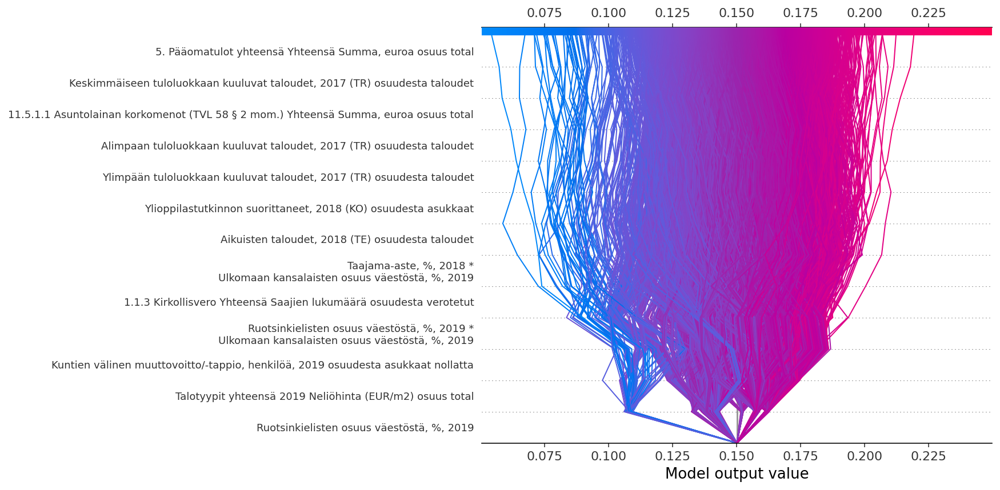

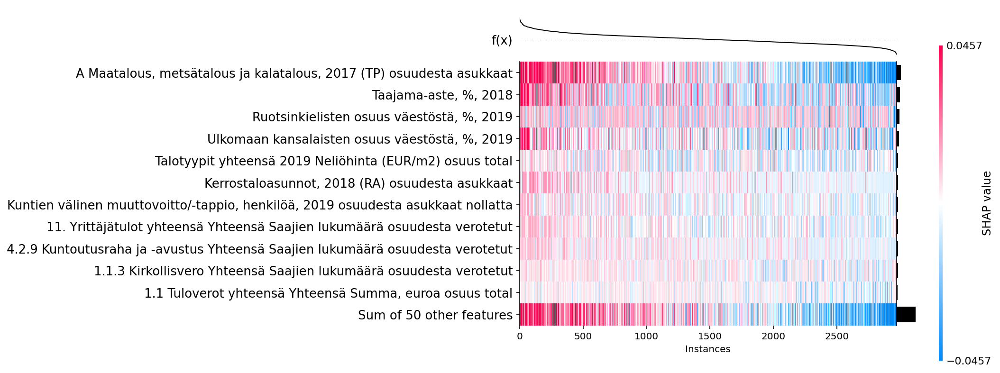

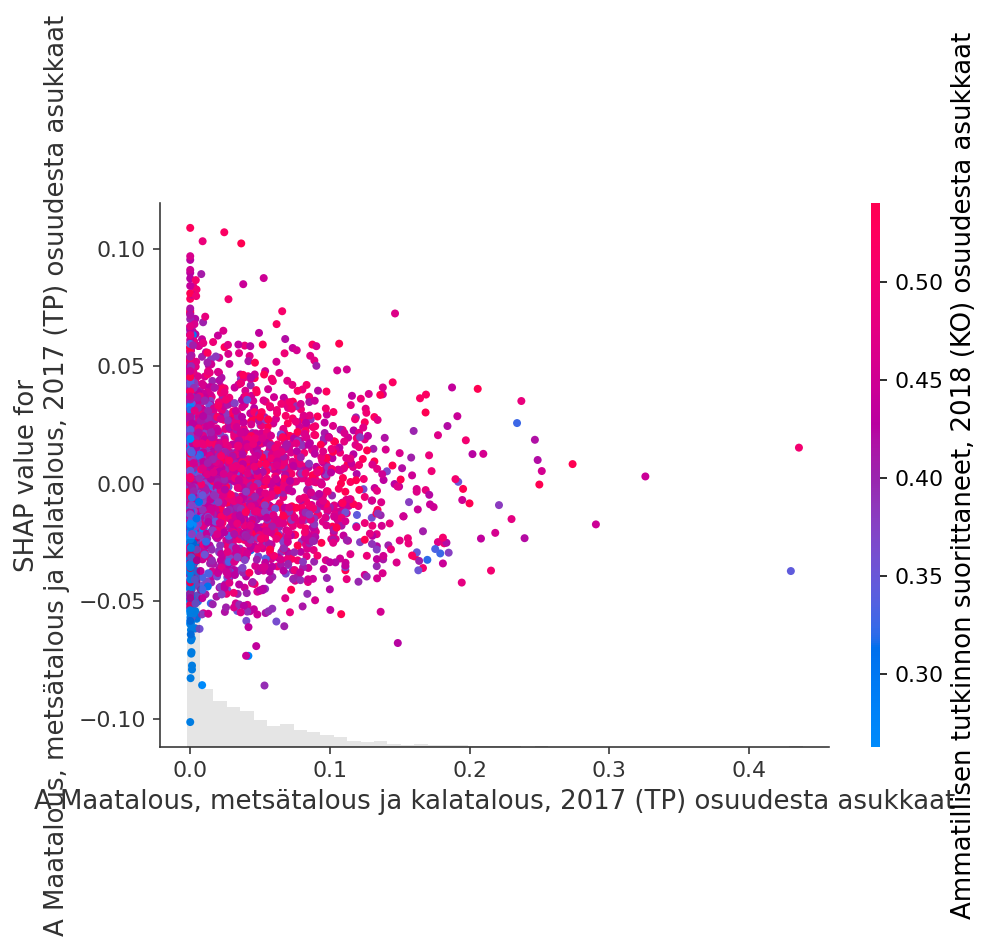

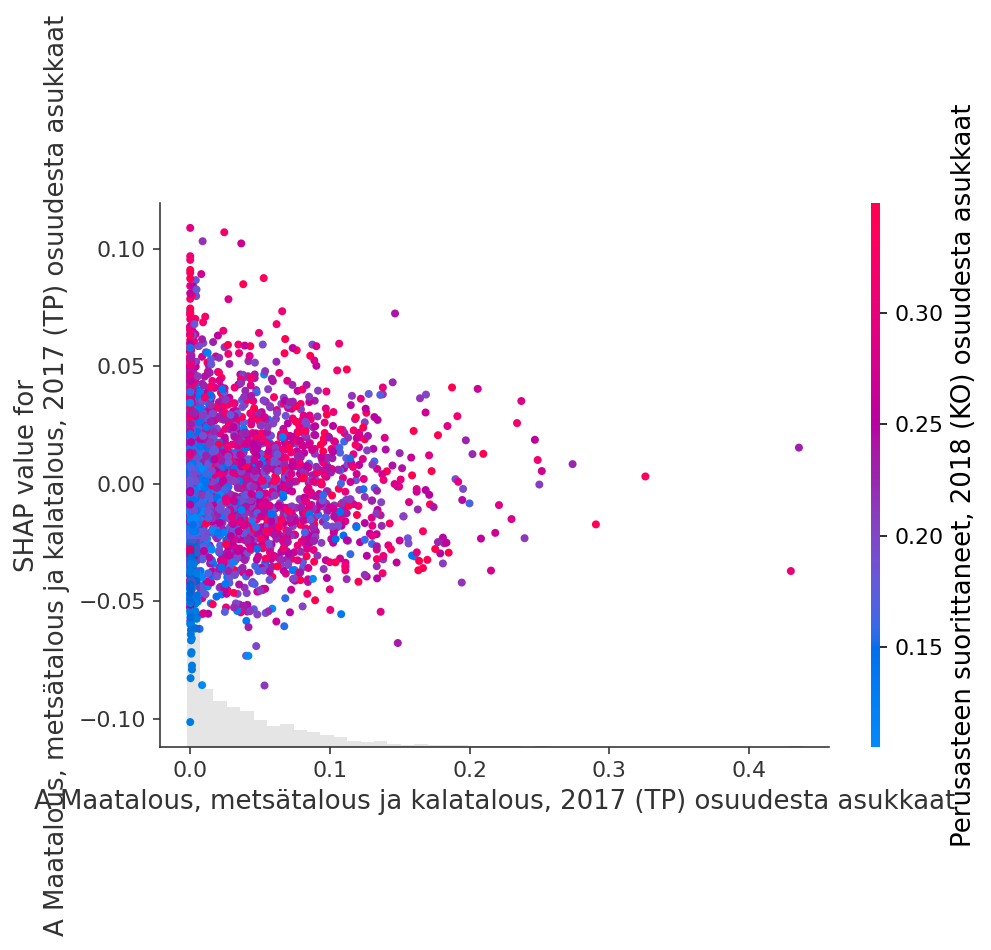

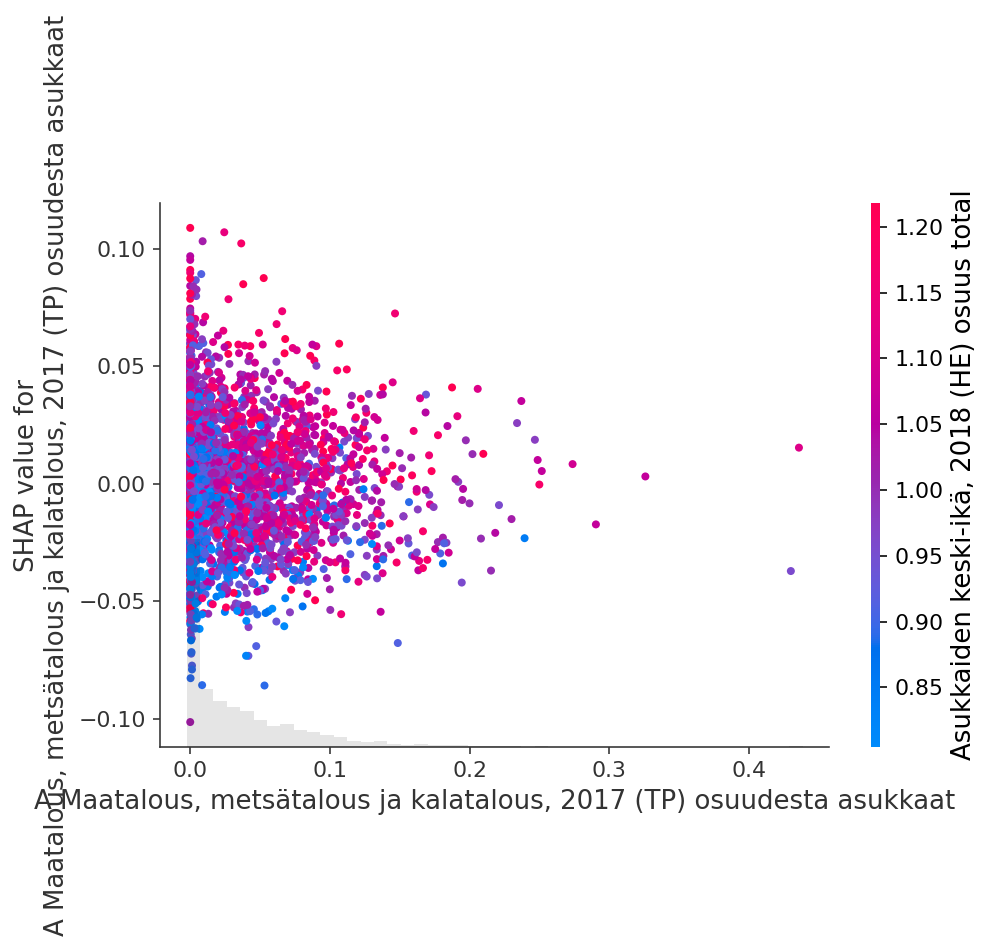

,Postinumero,nimi,muncipality_name,"Asukkaat yhteensä, 2018 (HE)",Suurin_puolue,Ennustettu Suurin_puolue,Ääniosuus SDP,Talotyypit yhteensä 2019 Neliöhinta (EUR/m2) osuus total,"Kerrostaloasunnot, 2018 (RA) osuudesta asukkaat","A Maatalous, metsätalous ja kalatalous, 2017 (TP) osuudesta asukkaat",1.1.3 Kirkollisvero Yhteensä Saajien lukumäärä osuudesta verotetut,11. Yrittäjätulot yhteensä Yhteensä Saajien lukumäärä osuudesta verotetut,4.2.9 Kuntoutusraha ja -avustus Yhteensä Saajien lukumäärä osuudesta verotetut,"14.7 Kotitalousvähennys Yhteensä Summa, euroa osuus total","1.1 Tuloverot yhteensä Yhteensä Summa, euroa osuus total","Ruotsinkielisten osuus väestöstä, %, 2019","Taajama-aste, %, 2018","Ulkomaan kansalaisten osuus väestöstä, %, 2019","Kuntien välinen muuttovoitto/-tappio, henkilöä, 2019 osuudesta asukkaat nollatta"
1598,55910,Rautio-Kurkvuori,Imatra,1539.0,SDP,SDP,0.406532,0.703751,0.107212,0.000650,0.589235,0.050047,0.007554,1.209087,0.916983,0.001,0.976,0.037,0.403240
1139,37800,Toijala keskus,Akaa,9300.0,SDP,SDP,0.275703,0.917058,0.177527,0.005161,0.580870,0.056151,0.015103,1.046473,0.925725,0.002,0.875,0.017,0.498239
2314,80160,Rantakylä-Latola,Joensuu,10201.0,SDP,SDP,0.273429,1.082694,0.283992,0.000490,0.564965,0.039332,0.016824,0.799206,0.644679,0.001,0.894,0.031,0.578707
2396,81700,Lieksa Keskus,Lieksa,5402.0,SDP,SDP,0.279913,0.541347,0.281007,0.012773,0.638961,0.064336,0.012388,0.951266,0.663994,0.001,0.702,0.030,0.305042
969,38250,Roismala,Sastamala,1363.0,SDP,SDP,0.281998,1.010784,0.013940,0.016875,0.620412,0.151298,0.015219,1.131264,0.903296,0.002,0.686,0.022,0.404946


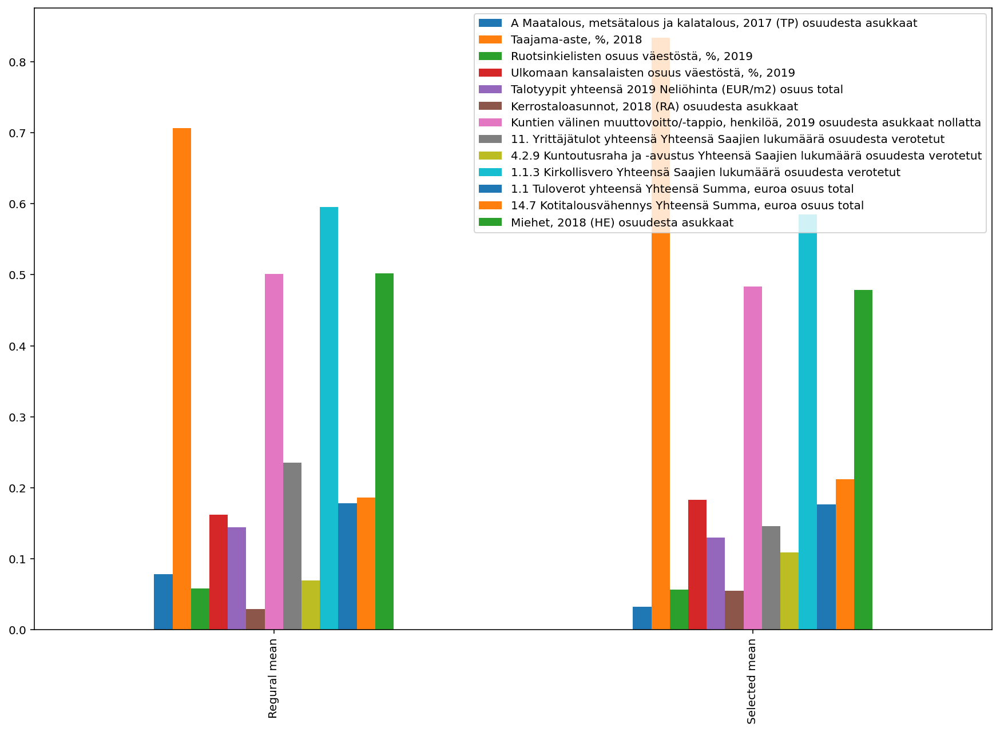

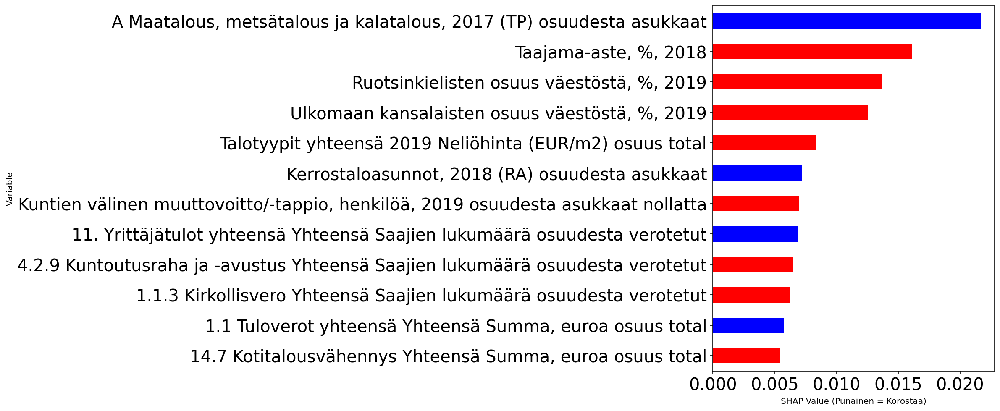

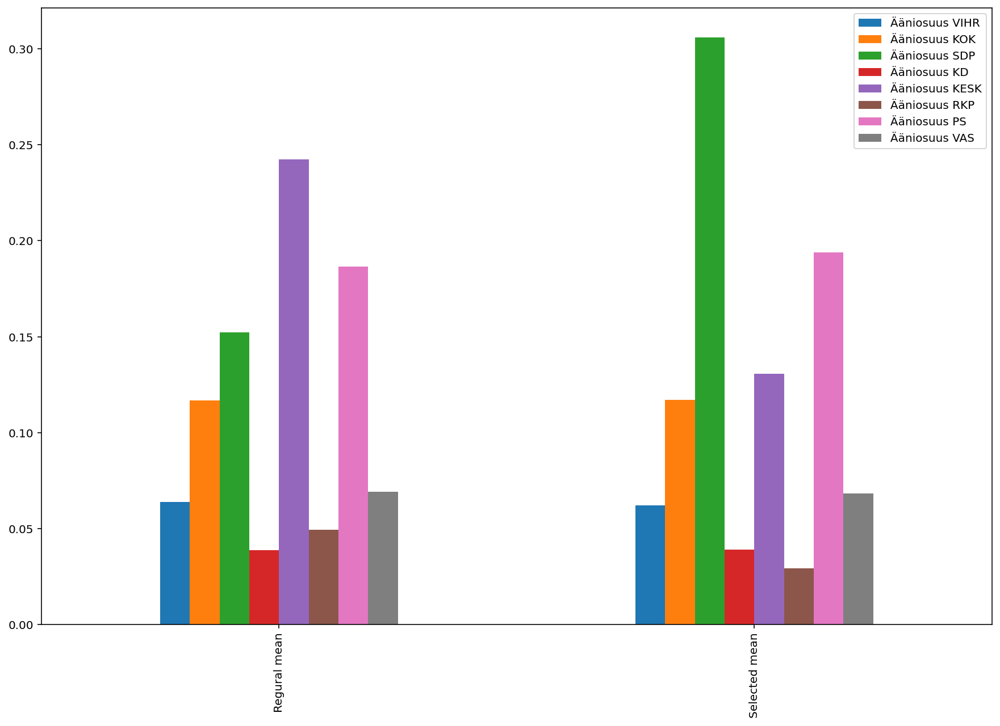

In [9]:
party = 'SDP'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

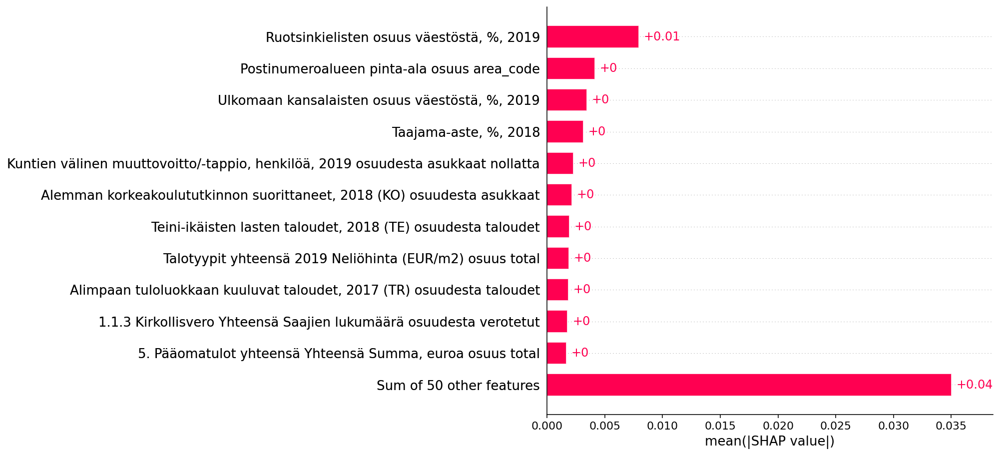

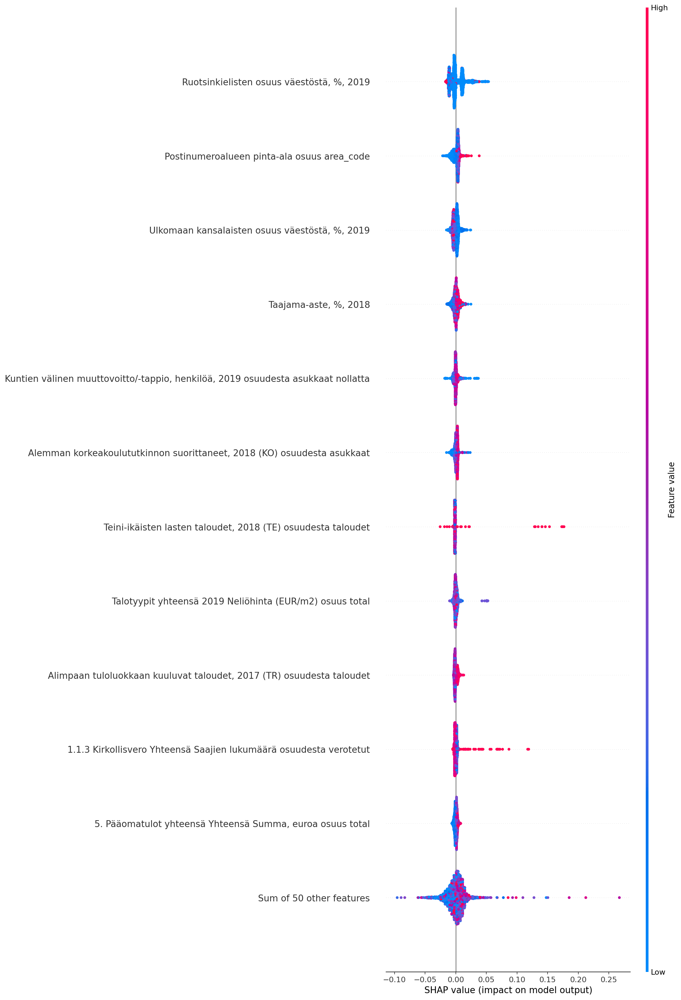

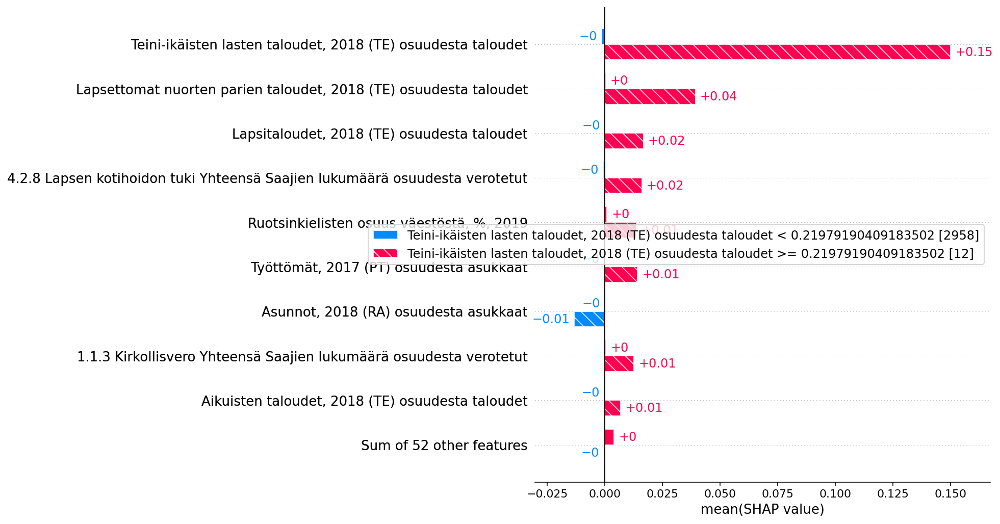

No/low signal found from feature 0 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 1 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 2 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 3 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 4 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 5 (this is typically caused by constant or near-constant features)! Cluster distan

 90%|█████████████████████████████████████▊    | 55/61 [00:10<00:00, 89.89it/s]No/low signal found from feature 55 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 56 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
 95%|███████████████████████████████████████▉  | 58/61 [00:26<00:04,  1.63s/it]No/low signal found from feature 57 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 58 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 59 (this is typically caused by constant or near-constant features)! Cluster distances can't be c

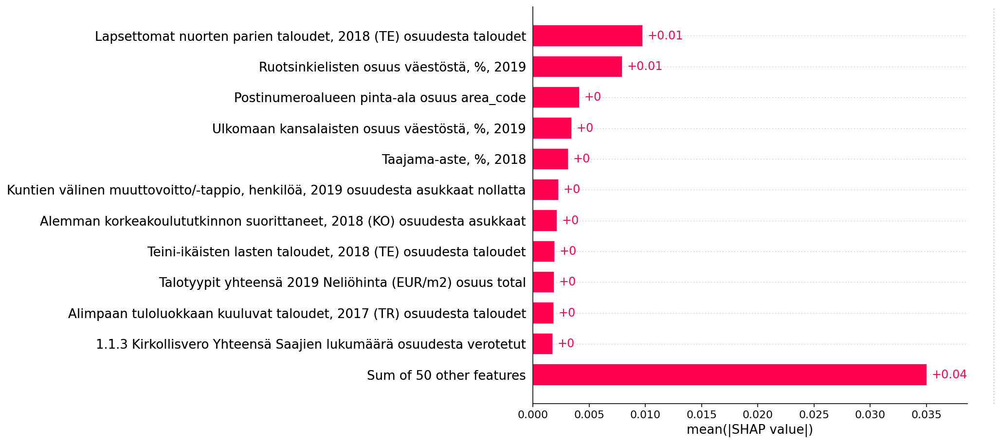

FixedFormatter should only be used together with FixedLocator


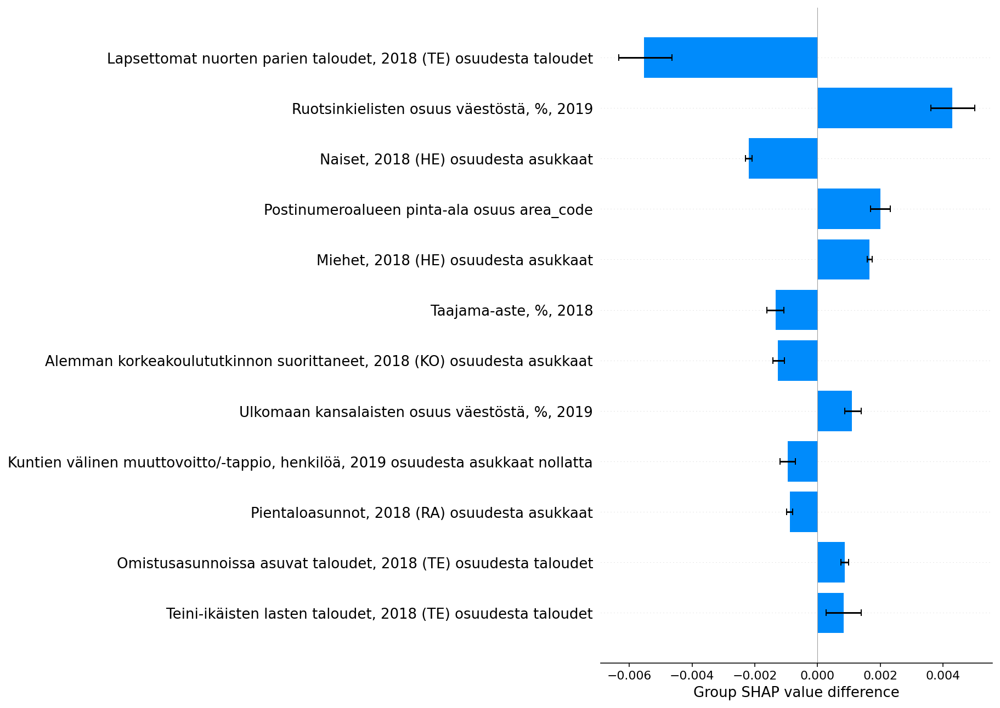

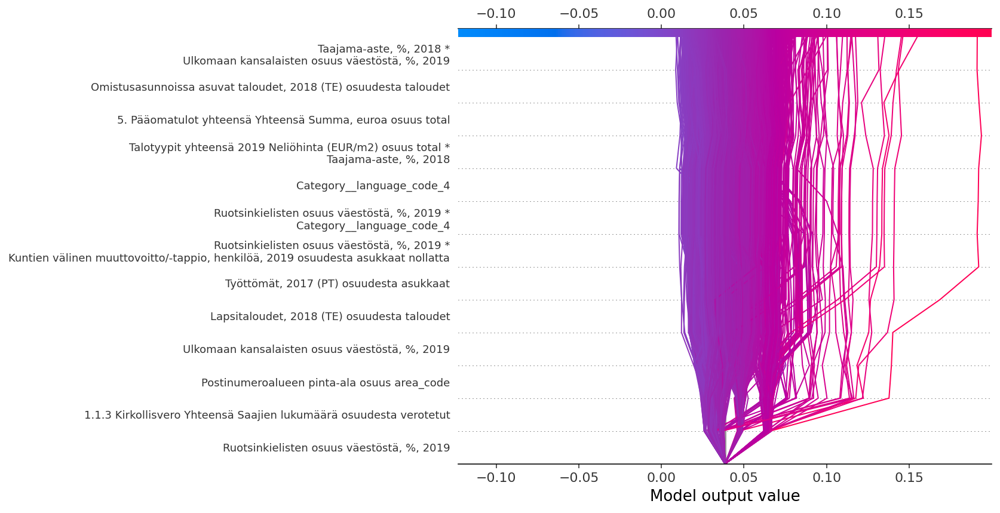

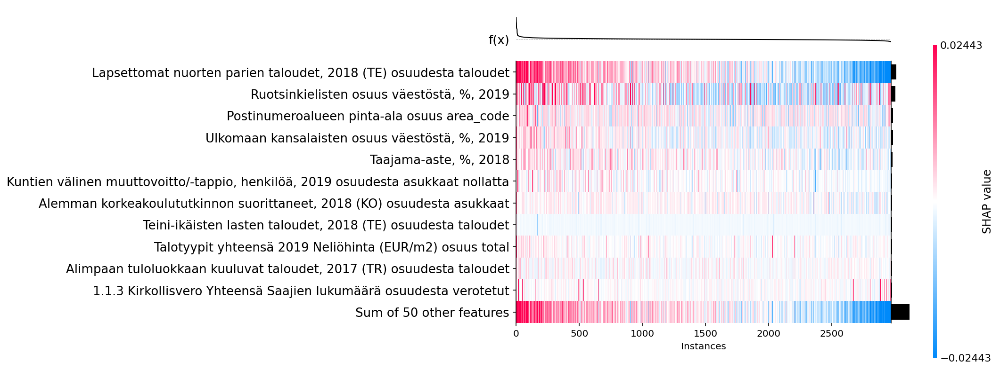

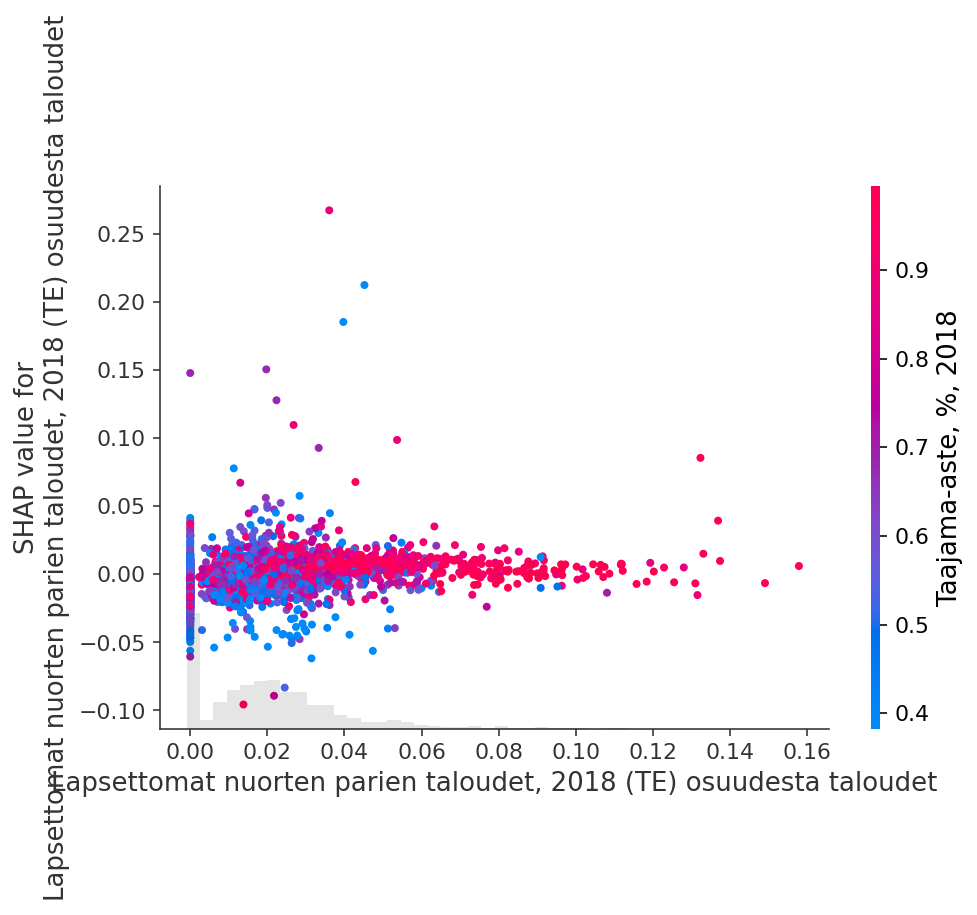

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


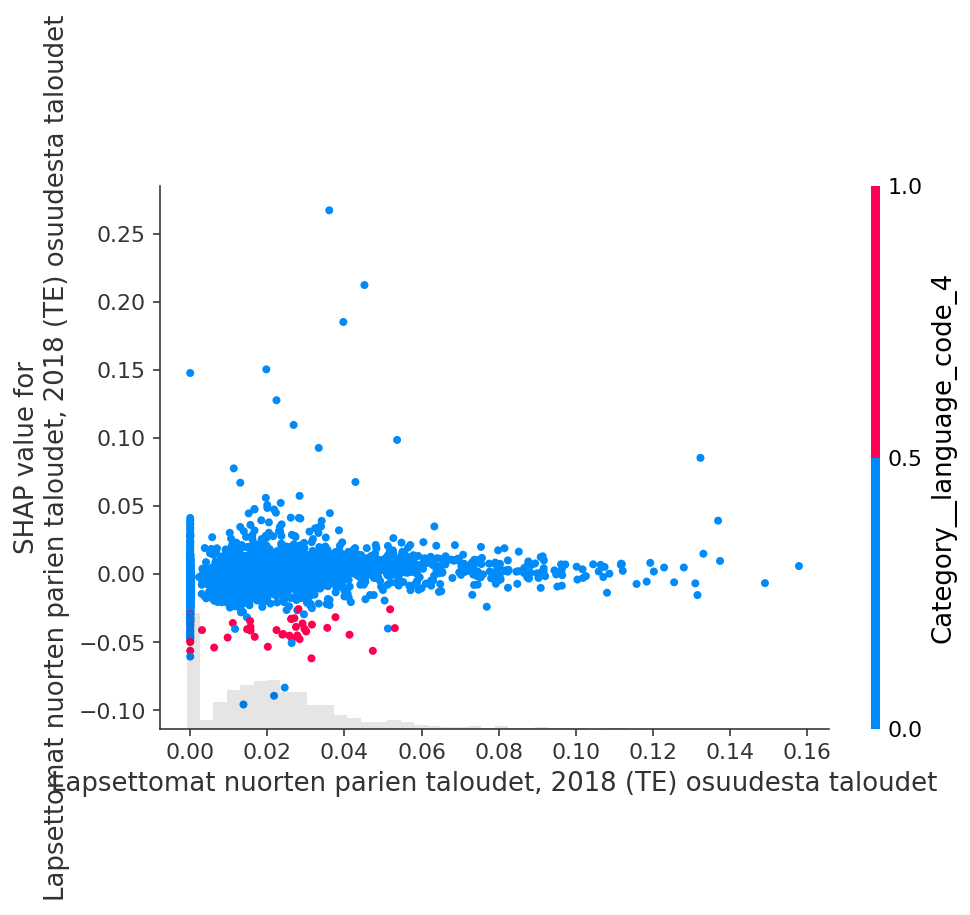

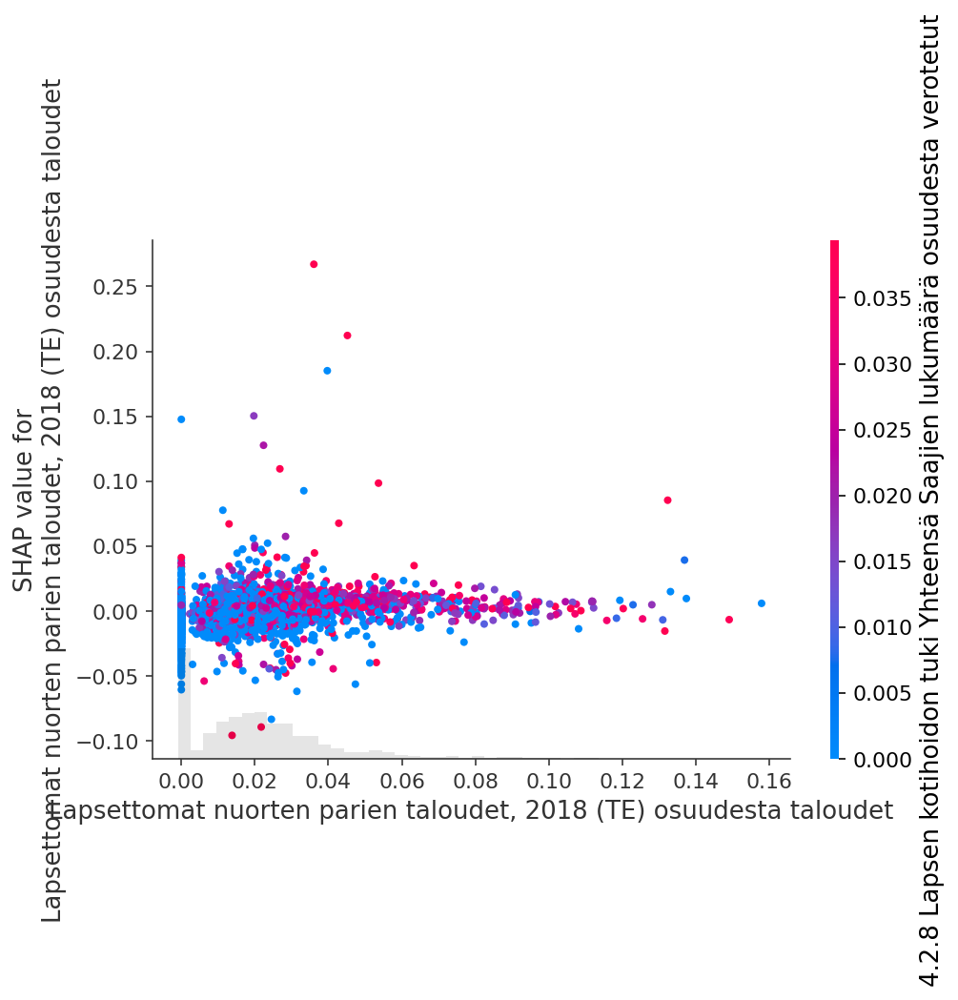

,Postinumero,nimi,muncipality_name,"Asukkaat yhteensä, 2018 (HE)",Suurin_puolue,Ennustettu Suurin_puolue,Ääniosuus KD,Talotyypit yhteensä 2019 Neliöhinta (EUR/m2) osuus total,Postinumeroalueen pinta-ala osuus area_code,"Alemman korkeakoulututkinnon suorittaneet, 2018 (KO) osuudesta asukkaat","Lapsettomat nuorten parien taloudet, 2018 (TE) osuudesta taloudet","Teini-ikäisten lasten taloudet, 2018 (TE) osuudesta taloudet","Alimpaan tuloluokkaan kuuluvat taloudet, 2017 (TR) osuudesta taloudet",1.1.3 Kirkollisvero Yhteensä Saajien lukumäärä osuudesta verotetut,"5. Pääomatulot yhteensä Yhteensä Summa, euroa osuus total","Ruotsinkielisten osuus väestöstä, %, 2019","Taajama-aste, %, 2018","Ulkomaan kansalaisten osuus väestöstä, %, 2019","Kuntien välinen muuttovoitto/-tappio, henkilöä, 2019 osuudesta asukkaat nollatta"
2066,70400,Kettulanlahti,Kuopio,761.0,KOK,KOK,0.069982,1.415583,0.000156,0.109067,0.025974,0.113636,0.129870,0.540419,1.581836,0.001,0.862,0.027,0.599077
2360,83430,Käsämä,Liperi,541.0,KESK,KESK,0.060241,0.895243,0.003412,0.103512,0.017241,0.125000,0.193966,0.634573,0.826864,0.001,0.571,0.009,0.494742
2165,72310,Niinivesi,Vesanto,226.0,KESK,KESK,0.061453,0.000000,0.004713,0.044248,0.000000,0.050000,0.408333,0.582915,1.001147,0.002,0.400,0.012,0.484800
2107,73310,Tahkovuori,Kuopio,82.0,PS,KESK,0.069767,1.415583,0.000984,0.134146,0.021277,0.063830,0.127660,0.634146,12.995776,0.001,0.862,0.027,0.545234
764,25460,Toija,Salo,1142.0,PS,KESK,0.070136,0.669008,0.012129,0.043783,0.014235,0.087189,0.298932,0.626204,0.674919,0.011,0.749,0.041,0.473476


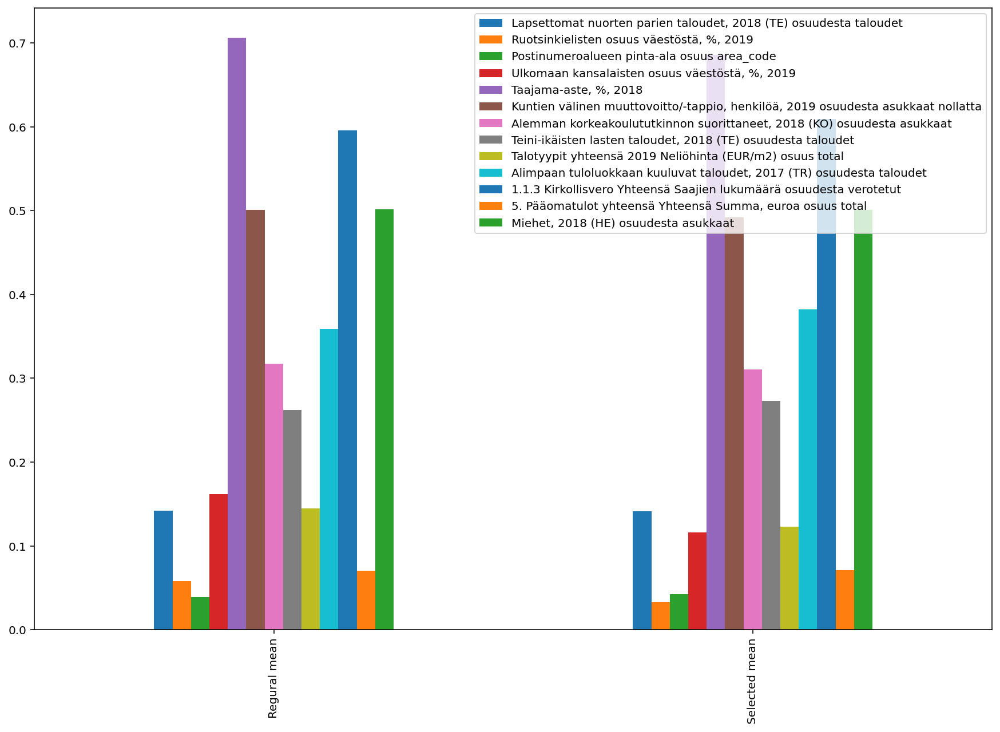

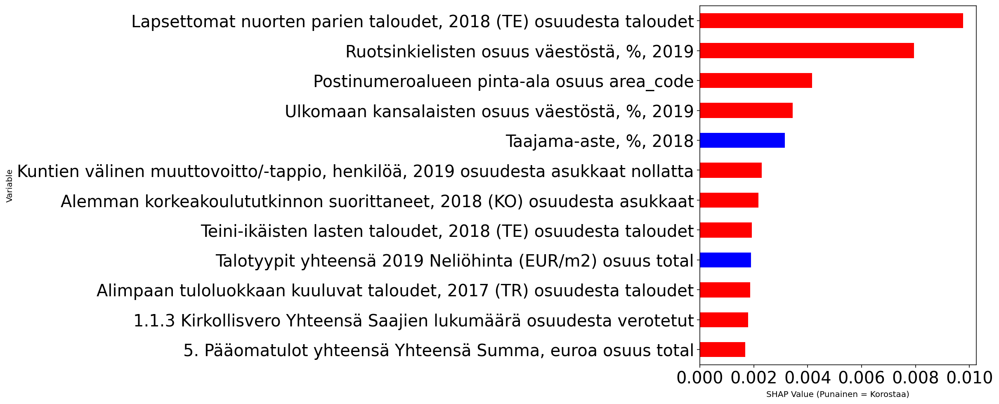

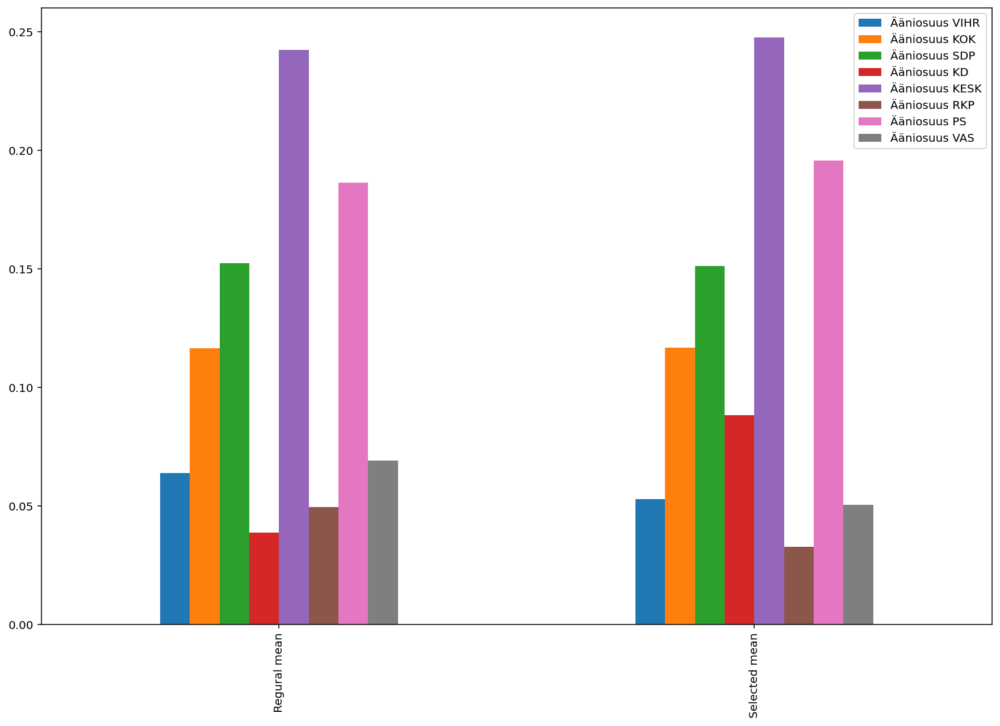

In [10]:
party ='KD'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

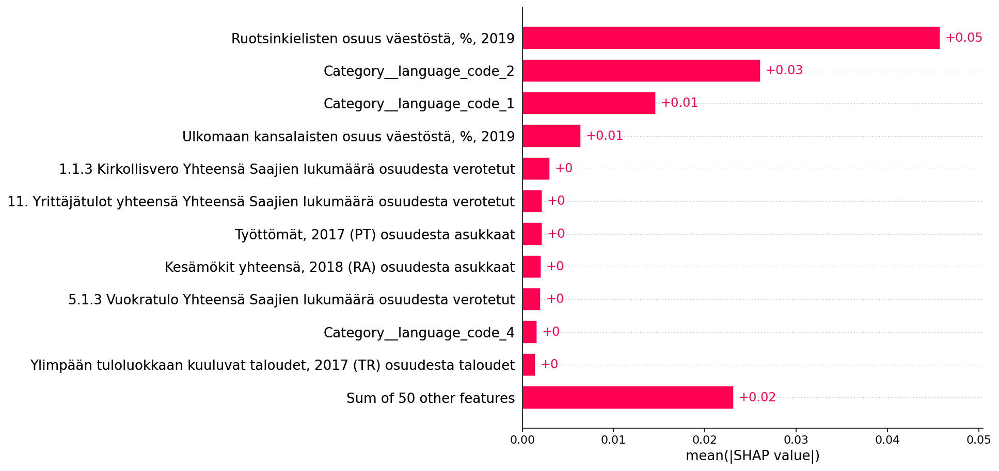

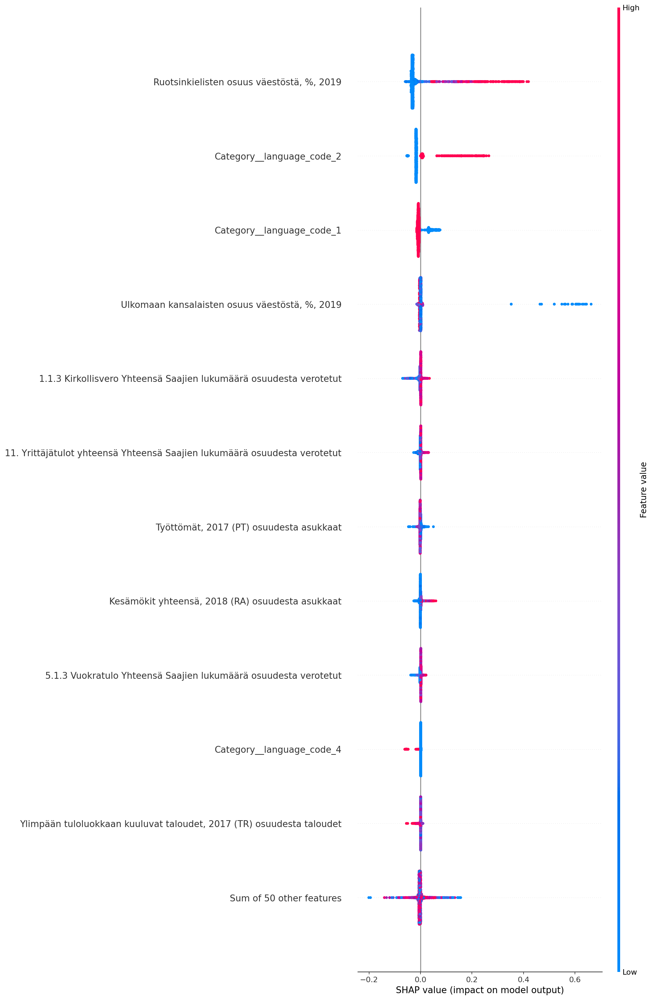

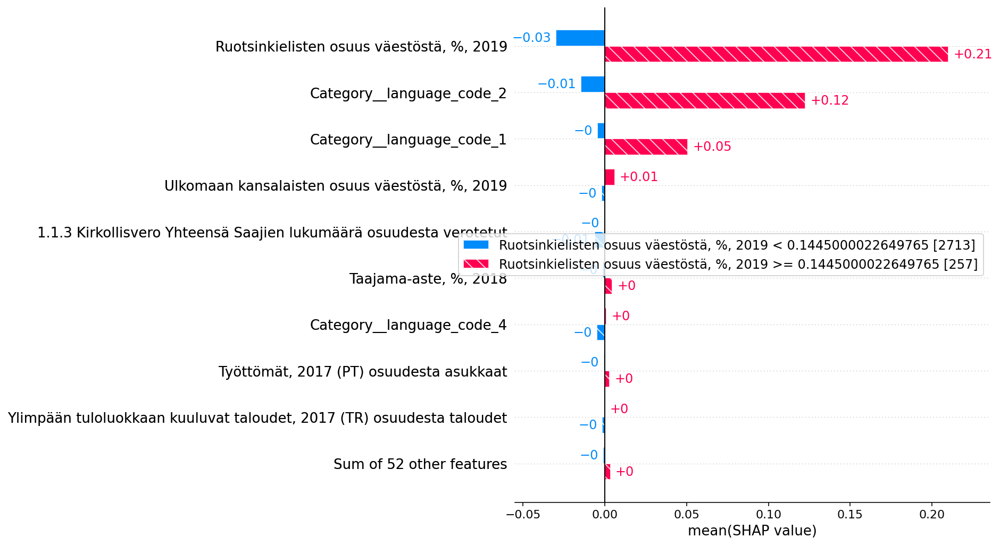

 85%|███████████████████████████████████▊      | 52/61 [06:14<01:09,  7.67s/it]No/low signal found from feature 51 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 52 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
62it [08:13,  7.95s/it]                                                        


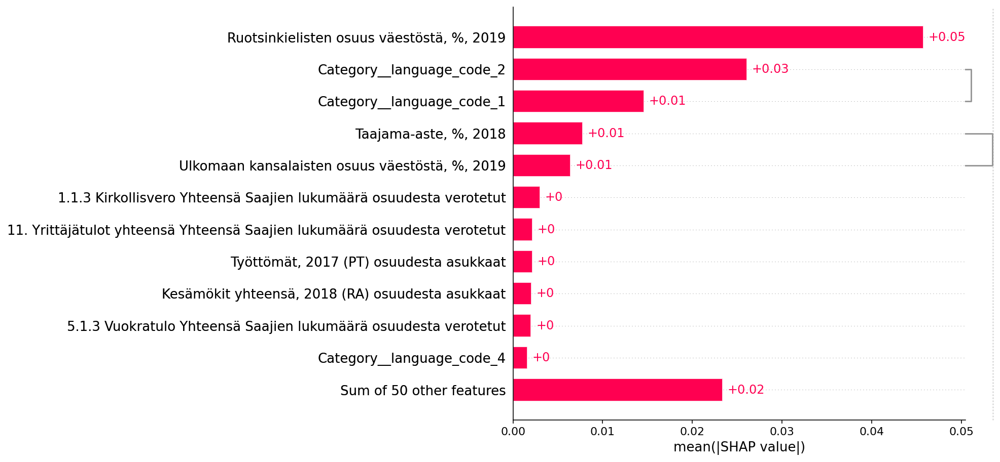

FixedFormatter should only be used together with FixedLocator


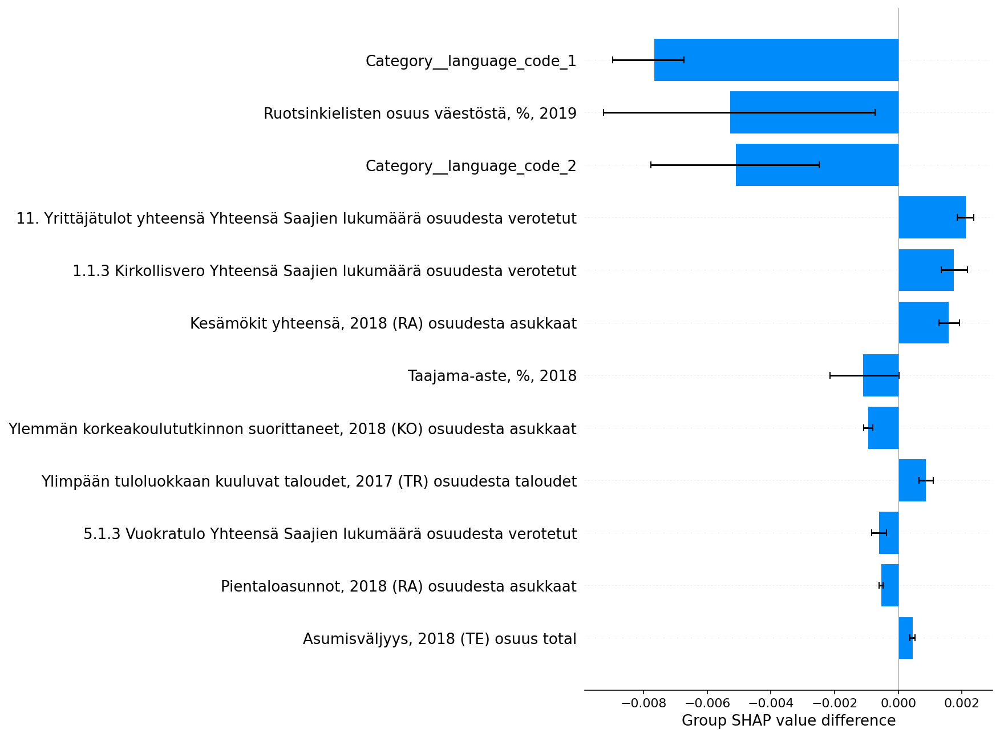

In [ ]:
party ='RKP'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

In [ ]:
party ='KESK'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

In [ ]:
party ='PS'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

In [ ]:
party ='VAS'
compare_to, t, aanet = create_party_results(target_col_start, party, data, compare_value)
stats_data, k, col_list = show_all_results(compare_to, data, X, y[t], model_list[t], vaalidata, shap_values[t], t, columns, all_included_columns, show_cols, scaled=scaled, included_columns=included_columns, samples=samples)

In [ ]:
pnro ='01300'
show_one_results(data, X, y, model_list, shap_values, target, pnro, columns)

In [ ]:
pnro ='00260'
show_one_results(data, X, y, model_list, shap_values, target, pnro, columns)

In [ ]:
pnro ='00320'
show_one_results(data, X, y, model_list, shap_values, target, pnro, columns)

In [ ]:
pnro ='33270'
show_one_results(data, X, y, model_list, shap_values, target, pnro, columns)

In [ ]:
pnro ='33540'
show_one_results(data, X, y, model_list, shap_values, target, pnro, columns)

In [ ]:
pnro ='33500'
show_one_results(data, X, y, model_list, shap_values, target, pnro, columns)